# DCGAN: GAN based on convolutional filters

In [2]:

import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    losses,
    utils,
    metrics,
    optimizers,
)

from utils import display, sample_batch

## 0. Parameters <a name="parameters"></a>

In [3]:
IMAGE_SIZE = 64
CHANNELS = 1
BATCH_SIZE = 128
Z_DIM = 100
EPOCHS = 300
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
LEARNING_RATE = 0.0002
NOISE_PARAM = 0.1

## 1. Prepare the data <a name="prepare"></a>

In [4]:
train_data = utils.image_dataset_from_directory(
    "./dataset/",
    labels=None,
    color_mode="grayscale",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 40000 files belonging to 1 classes.


In [5]:
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

In [6]:
train_sample = sample_batch(train)

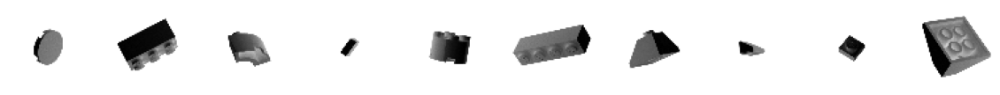

In [7]:
display(train_sample)

## 2. Build the GAN <a name="build"></a>

In [8]:
# discriminator
discriminator_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same", use_bias=False)(
    discriminator_input
)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    512, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    1,
    kernel_size=4,
    strides=1,
    padding="valid",
    use_bias=False,
    activation="sigmoid",
)(x)
discriminator_output = layers.Flatten()(x)

discriminator = models.Model(discriminator_input, discriminator_output)
discriminator.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        1024      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 128)      512       
 ormalization)                                                   
                                                             

In [9]:
# generator
generator_input = layers.Input(shape=(Z_DIM,))
x = layers.Reshape((1, 1, Z_DIM))(generator_input)
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS,
    kernel_size=4,
    strides=2,
    padding="same",
    use_bias=False,
    activation="tanh",
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 reshape (Reshape)           (None, 1, 1, 100)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        819200    
 nspose)                                                         
                                                                 
 batch_normalization_3 (Batc  (None, 4, 4, 512)        2048      
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 256)        2097

In [10]:
class DCGAN(models.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer):
        super(DCGAN, self).compile()
        self.loss_fn = losses.BinaryCrossentropy()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_metric = metrics.Mean(name="d_loss")
        self.d_real_acc_metric = metrics.BinaryAccuracy(name="d_real_acc")
        self.d_fake_acc_metric = metrics.BinaryAccuracy(name="d_fake_acc")
        self.d_acc_metric = metrics.BinaryAccuracy(name="d_acc")
        self.g_loss_metric = metrics.Mean(name="g_loss")
        self.g_acc_metric = metrics.BinaryAccuracy(name="g_acc")

    @property
    def metrics(self):
        return [
            self.d_loss_metric,
            self.d_real_acc_metric,
            self.d_fake_acc_metric,
            self.d_acc_metric,
            self.g_loss_metric,
            self.g_acc_metric,
        ]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )

        # Train the discriminator on fake images
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = self.generator(
                random_latent_vectors, training=True
            )
            real_predictions = self.discriminator(real_images, training=True)
            fake_predictions = self.discriminator(
                generated_images, training=True
            )

            real_labels = tf.ones_like(real_predictions)
            real_noisy_labels = real_labels + NOISE_PARAM * tf.random.uniform(
                tf.shape(real_predictions)
            )
            fake_labels = tf.zeros_like(fake_predictions)
            fake_noisy_labels = fake_labels - NOISE_PARAM * tf.random.uniform(
                tf.shape(fake_predictions)
            )
            # 비용함수
            d_real_loss = self.loss_fn(real_noisy_labels, real_predictions)
            d_fake_loss = self.loss_fn(fake_noisy_labels, fake_predictions)
            d_loss = (d_real_loss + d_fake_loss) / 2.0

            g_loss = self.loss_fn(real_labels, fake_predictions)

        gradients_of_discriminator = disc_tape.gradient(
            d_loss, self.discriminator.trainable_variables
        )
        gradients_of_generator = gen_tape.gradient(
            g_loss, self.generator.trainable_variables
        )

        self.d_optimizer.apply_gradients(
            zip(gradients_of_discriminator, discriminator.trainable_variables)
        )
        self.g_optimizer.apply_gradients(
            zip(gradients_of_generator, generator.trainable_variables)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.d_real_acc_metric.update_state(real_labels, real_predictions)
        self.d_fake_acc_metric.update_state(fake_labels, fake_predictions)
        self.d_acc_metric.update_state(
            [real_labels, fake_labels], [real_predictions, fake_predictions]
        )
        self.g_loss_metric.update_state(g_loss)
        self.g_acc_metric.update_state(real_labels, fake_predictions)

        return {m.name: m.result() for m in self.metrics}

In [11]:
# Create a DCGAN
dcgan = DCGAN(
    discriminator=discriminator, generator=generator, latent_dim=Z_DIM
)

In [ ]:
if LOAD_MODEL:
    dcgan.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [12]:
dcgan.compile(
    d_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [ ]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")

In [13]:
class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch), # 각 에포크별로 생성된 이미지 확인
        )

Epoch 1/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2720 - d_real_acc: 0.8383 - d_fake_acc: 0.8524 - d_acc: 0.8454 - g_loss: 4.0136 - g_acc: 0.1476
Saved to ./output/generated_img_000.png


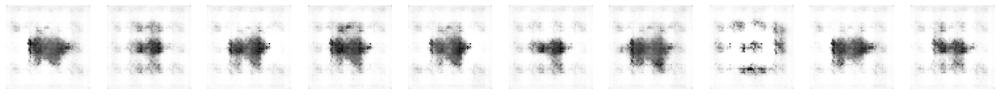

313/313 [==============================] - 662s 2s/step - d_loss: 0.2720 - d_real_acc: 0.8383 - d_fake_acc: 0.8524 - d_acc: 0.8454 - g_loss: 4.0136 - g_acc: 0.1476
Epoch 2/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0074 - d_real_acc: 0.9006 - d_fake_acc: 0.9099 - d_acc: 0.9052 - g_loss: 5.2344 - g_acc: 0.0901
Saved to ./output/generated_img_001.png


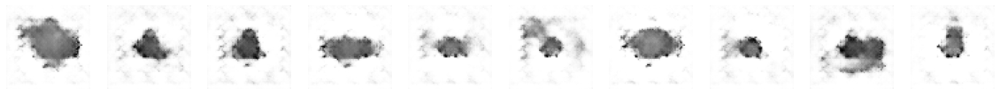

313/313 [==============================] - 657s 2s/step - d_loss: 0.0074 - d_real_acc: 0.9006 - d_fake_acc: 0.9099 - d_acc: 0.9052 - g_loss: 5.2344 - g_acc: 0.0901
Epoch 3/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0684 - d_real_acc: 0.9160 - d_fake_acc: 0.9194 - d_acc: 0.9177 - g_loss: 6.6102 - g_acc: 0.0806
Saved to ./output/generated_img_002.png


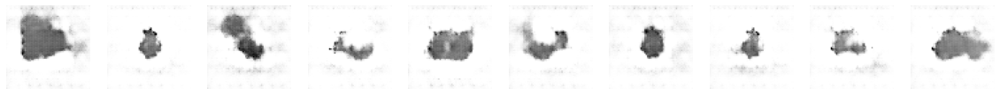

313/313 [==============================] - 655s 2s/step - d_loss: -0.0684 - d_real_acc: 0.9160 - d_fake_acc: 0.9194 - d_acc: 0.9177 - g_loss: 6.6102 - g_acc: 0.0806
Epoch 4/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0452 - d_real_acc: 0.8958 - d_fake_acc: 0.8980 - d_acc: 0.8969 - g_loss: 5.3167 - g_acc: 0.1020
Saved to ./output/generated_img_003.png


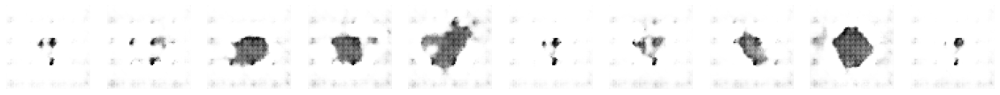

313/313 [==============================] - 654s 2s/step - d_loss: 0.0452 - d_real_acc: 0.8958 - d_fake_acc: 0.8980 - d_acc: 0.8969 - g_loss: 5.3167 - g_acc: 0.1020
Epoch 5/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0818 - d_real_acc: 0.8934 - d_fake_acc: 0.8946 - d_acc: 0.8940 - g_loss: 5.2317 - g_acc: 0.1054
Saved to ./output/generated_img_004.png


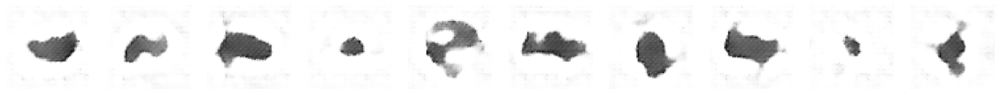

313/313 [==============================] - 655s 2s/step - d_loss: 0.0818 - d_real_acc: 0.8934 - d_fake_acc: 0.8946 - d_acc: 0.8940 - g_loss: 5.2317 - g_acc: 0.1054
Epoch 6/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0694 - d_real_acc: 0.8892 - d_fake_acc: 0.8920 - d_acc: 0.8906 - g_loss: 4.8874 - g_acc: 0.1080
Saved to ./output/generated_img_005.png


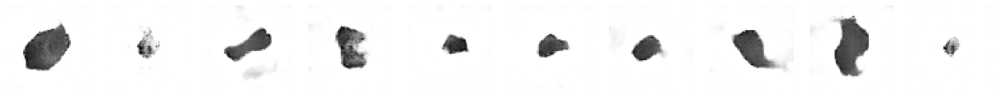

313/313 [==============================] - 654s 2s/step - d_loss: 0.0694 - d_real_acc: 0.8892 - d_fake_acc: 0.8920 - d_acc: 0.8906 - g_loss: 4.8874 - g_acc: 0.1080
Epoch 7/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1361 - d_real_acc: 0.8858 - d_fake_acc: 0.8816 - d_acc: 0.8837 - g_loss: 4.6829 - g_acc: 0.1184
Saved to ./output/generated_img_006.png


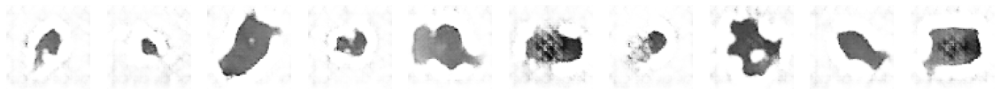

313/313 [==============================] - 660s 2s/step - d_loss: 0.1361 - d_real_acc: 0.8858 - d_fake_acc: 0.8816 - d_acc: 0.8837 - g_loss: 4.6829 - g_acc: 0.1184
Epoch 8/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0737 - d_real_acc: 0.8921 - d_fake_acc: 0.8914 - d_acc: 0.8917 - g_loss: 4.8236 - g_acc: 0.1086
Saved to ./output/generated_img_007.png


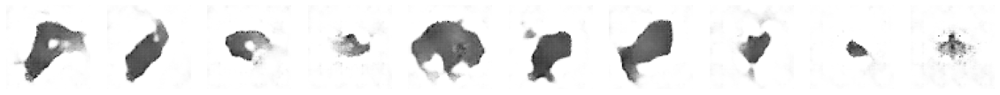

313/313 [==============================] - 660s 2s/step - d_loss: 0.0737 - d_real_acc: 0.8921 - d_fake_acc: 0.8914 - d_acc: 0.8917 - g_loss: 4.8236 - g_acc: 0.1086
Epoch 9/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0457 - d_real_acc: 0.8982 - d_fake_acc: 0.9017 - d_acc: 0.8999 - g_loss: 5.1465 - g_acc: 0.0984
Saved to ./output/generated_img_008.png


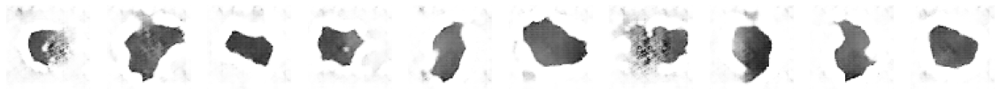

313/313 [==============================] - 661s 2s/step - d_loss: 0.0457 - d_real_acc: 0.8982 - d_fake_acc: 0.9017 - d_acc: 0.8999 - g_loss: 5.1465 - g_acc: 0.0984
Epoch 10/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0083 - d_real_acc: 0.9127 - d_fake_acc: 0.9140 - d_acc: 0.9133 - g_loss: 5.3115 - g_acc: 0.0860
Saved to ./output/generated_img_009.png


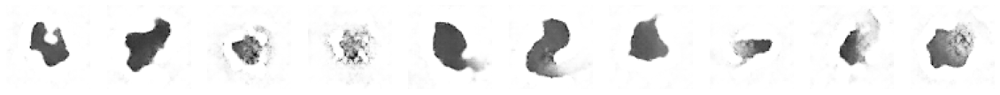

313/313 [==============================] - 1028s 3s/step - d_loss: -0.0083 - d_real_acc: 0.9127 - d_fake_acc: 0.9140 - d_acc: 0.9133 - g_loss: 5.3115 - g_acc: 0.0860
Epoch 11/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0555 - d_real_acc: 0.8968 - d_fake_acc: 0.8960 - d_acc: 0.8964 - g_loss: 5.2193 - g_acc: 0.1040
Saved to ./output/generated_img_010.png


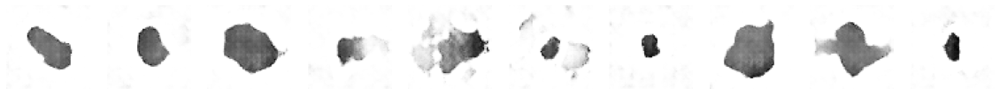

313/313 [==============================] - 657s 2s/step - d_loss: 0.0555 - d_real_acc: 0.8968 - d_fake_acc: 0.8960 - d_acc: 0.8964 - g_loss: 5.2193 - g_acc: 0.1040
Epoch 12/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0034 - d_real_acc: 0.9151 - d_fake_acc: 0.9146 - d_acc: 0.9148 - g_loss: 5.8046 - g_acc: 0.0854
Saved to ./output/generated_img_011.png


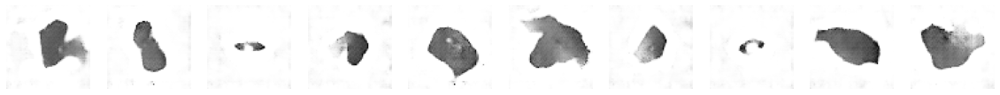

313/313 [==============================] - 657s 2s/step - d_loss: -0.0034 - d_real_acc: 0.9151 - d_fake_acc: 0.9146 - d_acc: 0.9148 - g_loss: 5.8046 - g_acc: 0.0854
Epoch 13/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0315 - d_real_acc: 0.9037 - d_fake_acc: 0.9047 - d_acc: 0.9042 - g_loss: 5.2916 - g_acc: 0.0953
Saved to ./output/generated_img_012.png


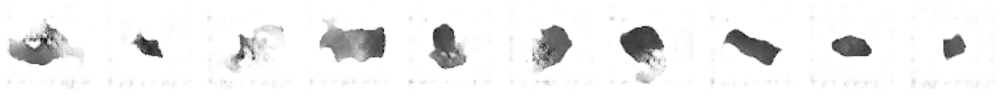

313/313 [==============================] - 658s 2s/step - d_loss: 0.0315 - d_real_acc: 0.9037 - d_fake_acc: 0.9047 - d_acc: 0.9042 - g_loss: 5.2916 - g_acc: 0.0953
Epoch 14/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0450 - d_real_acc: 0.9201 - d_fake_acc: 0.9216 - d_acc: 0.9209 - g_loss: 5.9350 - g_acc: 0.0784
Saved to ./output/generated_img_013.png


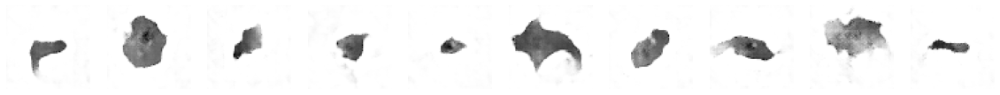

313/313 [==============================] - 656s 2s/step - d_loss: -0.0450 - d_real_acc: 0.9201 - d_fake_acc: 0.9216 - d_acc: 0.9209 - g_loss: 5.9350 - g_acc: 0.0784
Epoch 15/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0052 - d_real_acc: 0.9164 - d_fake_acc: 0.9161 - d_acc: 0.9163 - g_loss: 6.0997 - g_acc: 0.0838
Saved to ./output/generated_img_014.png


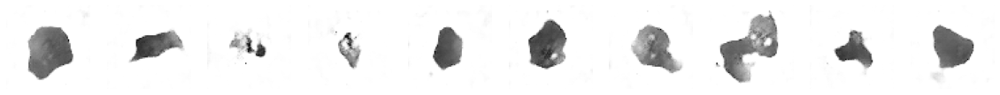

313/313 [==============================] - 659s 2s/step - d_loss: 0.0052 - d_real_acc: 0.9164 - d_fake_acc: 0.9161 - d_acc: 0.9163 - g_loss: 6.0997 - g_acc: 0.0838
Epoch 16/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1649 - d_real_acc: 0.8548 - d_fake_acc: 0.8532 - d_acc: 0.8540 - g_loss: 4.7257 - g_acc: 0.1468
Saved to ./output/generated_img_015.png


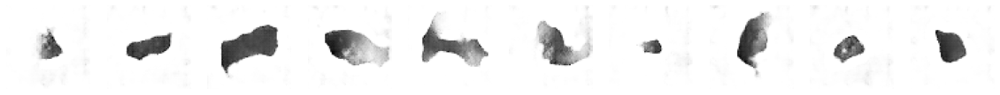

313/313 [==============================] - 659s 2s/step - d_loss: 0.1649 - d_real_acc: 0.8548 - d_fake_acc: 0.8532 - d_acc: 0.8540 - g_loss: 4.7257 - g_acc: 0.1468
Epoch 17/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0047 - d_real_acc: 0.9143 - d_fake_acc: 0.9136 - d_acc: 0.9140 - g_loss: 5.8207 - g_acc: 0.0864
Saved to ./output/generated_img_016.png


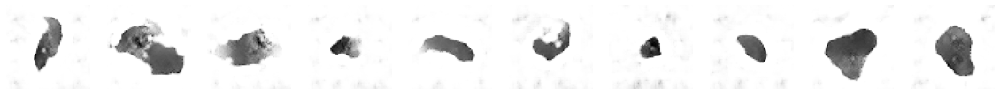

313/313 [==============================] - 657s 2s/step - d_loss: 0.0047 - d_real_acc: 0.9143 - d_fake_acc: 0.9136 - d_acc: 0.9140 - g_loss: 5.8207 - g_acc: 0.0864
Epoch 18/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0875 - d_real_acc: 0.9399 - d_fake_acc: 0.9410 - d_acc: 0.9405 - g_loss: 6.8762 - g_acc: 0.0589
Saved to ./output/generated_img_017.png


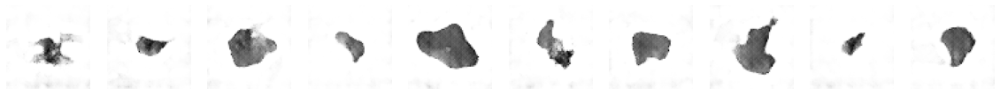

313/313 [==============================] - 659s 2s/step - d_loss: -0.0875 - d_real_acc: 0.9399 - d_fake_acc: 0.9410 - d_acc: 0.9405 - g_loss: 6.8762 - g_acc: 0.0589
Epoch 19/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0317 - d_real_acc: 0.9162 - d_fake_acc: 0.9195 - d_acc: 0.9179 - g_loss: 5.8829 - g_acc: 0.0805
Saved to ./output/generated_img_018.png


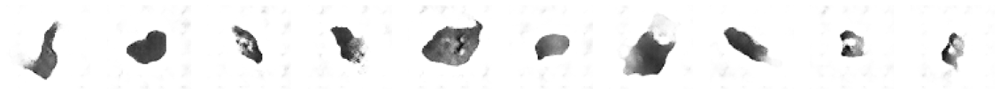

313/313 [==============================] - 658s 2s/step - d_loss: -0.0317 - d_real_acc: 0.9162 - d_fake_acc: 0.9195 - d_acc: 0.9179 - g_loss: 5.8829 - g_acc: 0.0805
Epoch 20/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1383 - d_real_acc: 0.9478 - d_fake_acc: 0.9492 - d_acc: 0.9485 - g_loss: 6.8199 - g_acc: 0.0508
Saved to ./output/generated_img_019.png


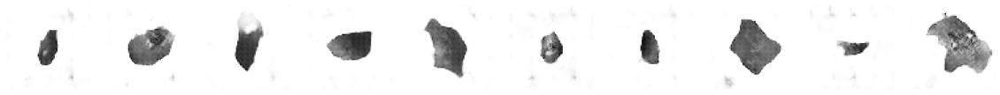

313/313 [==============================] - 660s 2s/step - d_loss: -0.1383 - d_real_acc: 0.9478 - d_fake_acc: 0.9492 - d_acc: 0.9485 - g_loss: 6.8199 - g_acc: 0.0508
Epoch 21/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1093 - d_real_acc: 0.9377 - d_fake_acc: 0.9377 - d_acc: 0.9377 - g_loss: 7.0058 - g_acc: 0.0622
Saved to ./output/generated_img_020.png


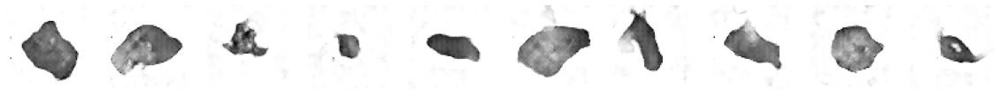

313/313 [==============================] - 829s 3s/step - d_loss: -0.1093 - d_real_acc: 0.9377 - d_fake_acc: 0.9377 - d_acc: 0.9377 - g_loss: 7.0058 - g_acc: 0.0622
Epoch 22/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1049 - d_real_acc: 0.9410 - d_fake_acc: 0.9402 - d_acc: 0.9406 - g_loss: 6.4815 - g_acc: 0.0598
Saved to ./output/generated_img_021.png


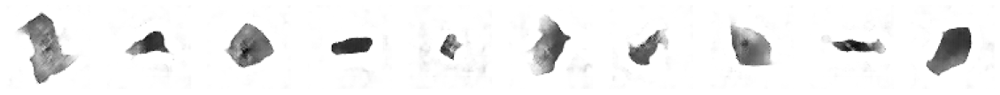

313/313 [==============================] - 658s 2s/step - d_loss: -0.1049 - d_real_acc: 0.9410 - d_fake_acc: 0.9402 - d_acc: 0.9406 - g_loss: 6.4815 - g_acc: 0.0598
Epoch 23/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0872 - d_real_acc: 0.9345 - d_fake_acc: 0.9360 - d_acc: 0.9352 - g_loss: 6.7910 - g_acc: 0.0640
Saved to ./output/generated_img_022.png


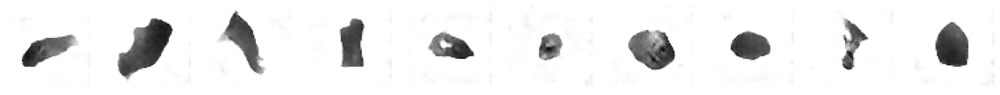

313/313 [==============================] - 657s 2s/step - d_loss: -0.0872 - d_real_acc: 0.9345 - d_fake_acc: 0.9360 - d_acc: 0.9352 - g_loss: 6.7910 - g_acc: 0.0640
Epoch 24/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1849 - d_real_acc: 0.9506 - d_fake_acc: 0.9530 - d_acc: 0.9518 - g_loss: 7.6829 - g_acc: 0.0470
Saved to ./output/generated_img_023.png


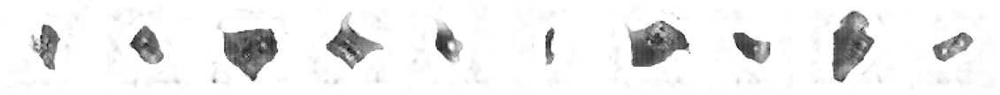

313/313 [==============================] - 659s 2s/step - d_loss: -0.1849 - d_real_acc: 0.9506 - d_fake_acc: 0.9530 - d_acc: 0.9518 - g_loss: 7.6829 - g_acc: 0.0470
Epoch 25/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0255 - d_real_acc: 0.9072 - d_fake_acc: 0.9056 - d_acc: 0.9064 - g_loss: 6.2547 - g_acc: 0.0944
Saved to ./output/generated_img_024.png


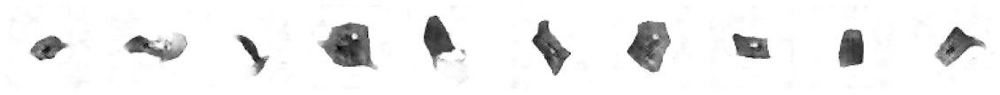

313/313 [==============================] - 657s 2s/step - d_loss: 0.0255 - d_real_acc: 0.9072 - d_fake_acc: 0.9056 - d_acc: 0.9064 - g_loss: 6.2547 - g_acc: 0.0944
Epoch 26/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1460 - d_real_acc: 0.9463 - d_fake_acc: 0.9477 - d_acc: 0.9470 - g_loss: 7.3944 - g_acc: 0.0523
Saved to ./output/generated_img_025.png


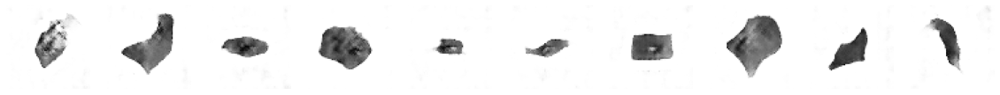

313/313 [==============================] - 658s 2s/step - d_loss: -0.1460 - d_real_acc: 0.9463 - d_fake_acc: 0.9477 - d_acc: 0.9470 - g_loss: 7.3944 - g_acc: 0.0523
Epoch 27/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1368 - d_real_acc: 0.9414 - d_fake_acc: 0.9475 - d_acc: 0.9445 - g_loss: 7.7331 - g_acc: 0.0525
Saved to ./output/generated_img_026.png


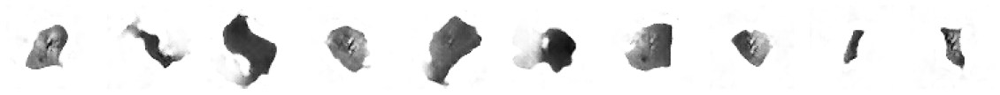

313/313 [==============================] - 657s 2s/step - d_loss: -0.1368 - d_real_acc: 0.9414 - d_fake_acc: 0.9475 - d_acc: 0.9445 - g_loss: 7.7331 - g_acc: 0.0525
Epoch 28/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1604 - d_real_acc: 0.9409 - d_fake_acc: 0.9394 - d_acc: 0.9402 - g_loss: 7.3309 - g_acc: 0.0606
Saved to ./output/generated_img_027.png


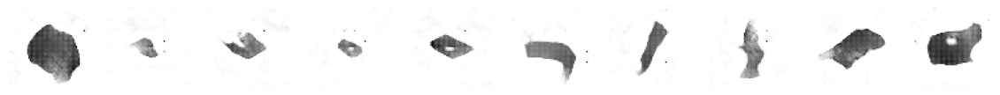

313/313 [==============================] - 659s 2s/step - d_loss: -0.1604 - d_real_acc: 0.9409 - d_fake_acc: 0.9394 - d_acc: 0.9402 - g_loss: 7.3309 - g_acc: 0.0606
Epoch 29/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0819 - d_real_acc: 0.9315 - d_fake_acc: 0.9379 - d_acc: 0.9347 - g_loss: 7.6151 - g_acc: 0.0621
Saved to ./output/generated_img_028.png


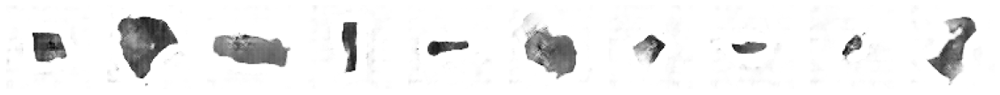

313/313 [==============================] - 658s 2s/step - d_loss: -0.0819 - d_real_acc: 0.9315 - d_fake_acc: 0.9379 - d_acc: 0.9347 - g_loss: 7.6151 - g_acc: 0.0621
Epoch 30/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0068 - d_real_acc: 0.9191 - d_fake_acc: 0.9354 - d_acc: 0.9272 - g_loss: 7.8440 - g_acc: 0.0646
Saved to ./output/generated_img_029.png


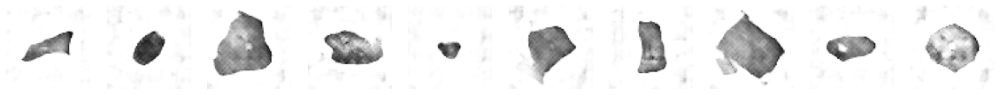

313/313 [==============================] - 658s 2s/step - d_loss: 0.0068 - d_real_acc: 0.9191 - d_fake_acc: 0.9354 - d_acc: 0.9272 - g_loss: 7.8440 - g_acc: 0.0646
Epoch 31/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2543 - d_real_acc: 0.9595 - d_fake_acc: 0.9611 - d_acc: 0.9603 - g_loss: 8.2660 - g_acc: 0.0389
Saved to ./output/generated_img_030.png


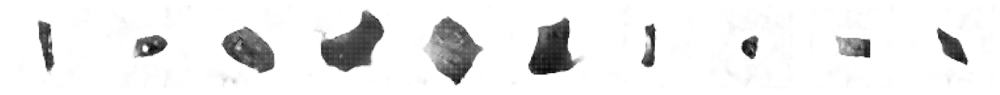

313/313 [==============================] - 657s 2s/step - d_loss: -0.2543 - d_real_acc: 0.9595 - d_fake_acc: 0.9611 - d_acc: 0.9603 - g_loss: 8.2660 - g_acc: 0.0389
Epoch 32/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2342 - d_real_acc: 0.9517 - d_fake_acc: 0.9544 - d_acc: 0.9530 - g_loss: 9.0764 - g_acc: 0.0456
Saved to ./output/generated_img_031.png


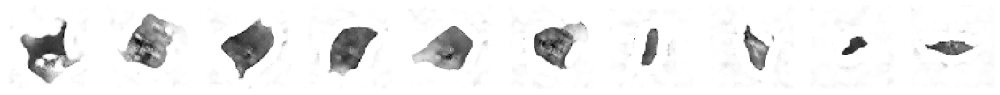

313/313 [==============================] - 658s 2s/step - d_loss: -0.2342 - d_real_acc: 0.9517 - d_fake_acc: 0.9544 - d_acc: 0.9530 - g_loss: 9.0764 - g_acc: 0.0456
Epoch 33/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1960 - d_real_acc: 0.9495 - d_fake_acc: 0.9494 - d_acc: 0.9494 - g_loss: 7.5401 - g_acc: 0.0506
Saved to ./output/generated_img_032.png


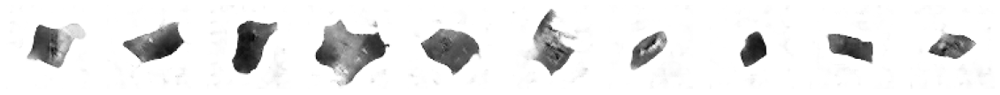

313/313 [==============================] - 1272s 4s/step - d_loss: -0.1960 - d_real_acc: 0.9495 - d_fake_acc: 0.9494 - d_acc: 0.9494 - g_loss: 7.5401 - g_acc: 0.0506
Epoch 34/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2292 - d_real_acc: 0.9475 - d_fake_acc: 0.9557 - d_acc: 0.9516 - g_loss: 9.4328 - g_acc: 0.0443
Saved to ./output/generated_img_033.png


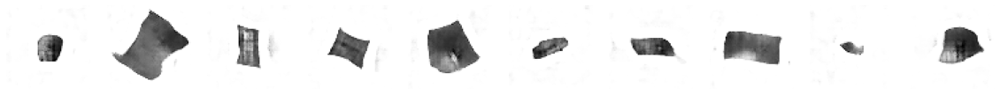

313/313 [==============================] - 658s 2s/step - d_loss: -0.2292 - d_real_acc: 0.9475 - d_fake_acc: 0.9557 - d_acc: 0.9516 - g_loss: 9.4328 - g_acc: 0.0443
Epoch 35/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1888 - d_real_acc: 0.9432 - d_fake_acc: 0.9436 - d_acc: 0.9434 - g_loss: 8.7372 - g_acc: 0.0564
Saved to ./output/generated_img_034.png


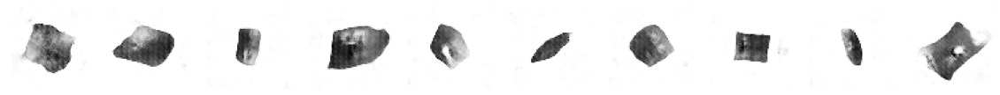

313/313 [==============================] - 659s 2s/step - d_loss: -0.1888 - d_real_acc: 0.9432 - d_fake_acc: 0.9436 - d_acc: 0.9434 - g_loss: 8.7372 - g_acc: 0.0564
Epoch 36/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1760 - d_real_acc: 0.9336 - d_fake_acc: 0.9369 - d_acc: 0.9352 - g_loss: 8.0481 - g_acc: 0.0631
Saved to ./output/generated_img_035.png


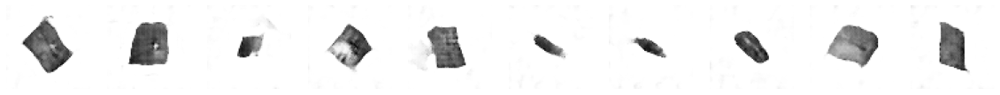

313/313 [==============================] - 658s 2s/step - d_loss: -0.1760 - d_real_acc: 0.9336 - d_fake_acc: 0.9369 - d_acc: 0.9352 - g_loss: 8.0481 - g_acc: 0.0631
Epoch 37/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1532 - d_real_acc: 0.9409 - d_fake_acc: 0.9417 - d_acc: 0.9413 - g_loss: 8.0423 - g_acc: 0.0583
Saved to ./output/generated_img_036.png


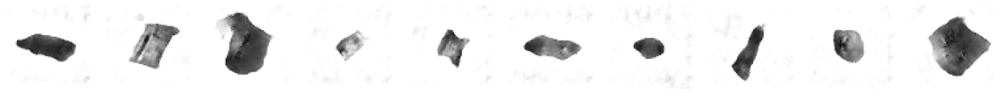

313/313 [==============================] - 657s 2s/step - d_loss: -0.1532 - d_real_acc: 0.9409 - d_fake_acc: 0.9417 - d_acc: 0.9413 - g_loss: 8.0423 - g_acc: 0.0583
Epoch 38/300
313/313 [==============================] - ETA: 0s - d_loss: 4.6115 - d_real_acc: 0.3688 - d_fake_acc: 0.9797 - d_acc: 0.6743 - g_loss: 13.3197 - g_acc: 0.0203
Saved to ./output/generated_img_037.png


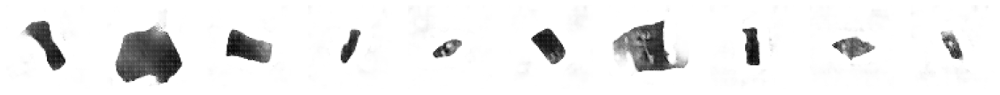

313/313 [==============================] - 655s 2s/step - d_loss: 4.6115 - d_real_acc: 0.3688 - d_fake_acc: 0.9797 - d_acc: 0.6743 - g_loss: 13.3197 - g_acc: 0.0203
Epoch 39/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7505 - d_real_acc: 0.9998 - d_fake_acc: 0.9995 - d_acc: 0.9996 - g_loss: 15.1156 - g_acc: 5.2500e-04
Saved to ./output/generated_img_038.png


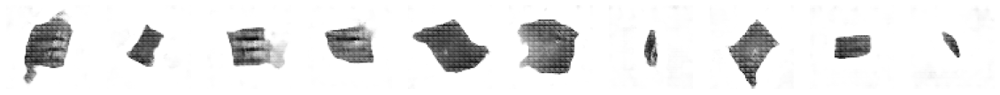

313/313 [==============================] - 659s 2s/step - d_loss: -0.7505 - d_real_acc: 0.9998 - d_fake_acc: 0.9995 - d_acc: 0.9996 - g_loss: 15.1156 - g_acc: 5.2500e-04
Epoch 40/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7681 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4246 - g_acc: 0.0000e+00
Saved to ./output/generated_img_039.png


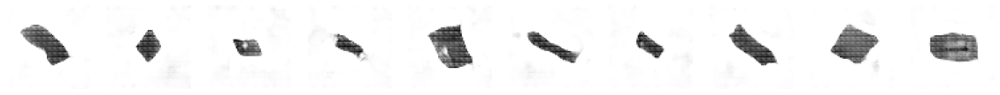

313/313 [==============================] - 656s 2s/step - d_loss: -0.7681 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4246 - g_acc: 0.0000e+00
Epoch 41/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7665 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Saved to ./output/generated_img_040.png


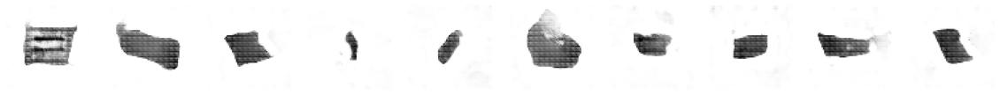

313/313 [==============================] - 657s 2s/step - d_loss: -0.7665 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Epoch 42/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7643 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4246 - g_acc: 0.0000e+00
Saved to ./output/generated_img_041.png


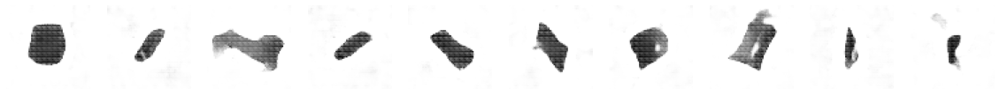

313/313 [==============================] - 654s 2s/step - d_loss: -0.7643 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4246 - g_acc: 0.0000e+00
Epoch 43/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7675 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4244 - g_acc: 0.0000e+00
Saved to ./output/generated_img_042.png


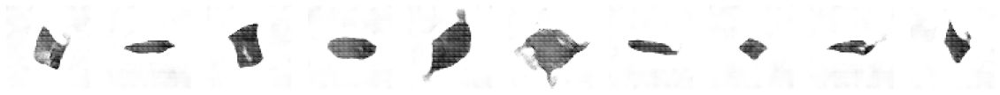

313/313 [==============================] - 653s 2s/step - d_loss: -0.7675 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4244 - g_acc: 0.0000e+00
Epoch 44/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7660 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4247 - g_acc: 0.0000e+00
Saved to ./output/generated_img_043.png


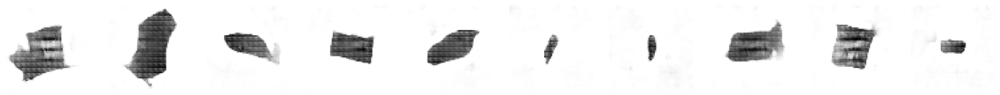

313/313 [==============================] - 656s 2s/step - d_loss: -0.7660 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4247 - g_acc: 0.0000e+00
Epoch 45/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7676 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4243 - g_acc: 0.0000e+00
Saved to ./output/generated_img_044.png


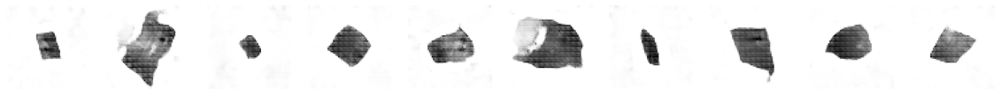

313/313 [==============================] - 851s 3s/step - d_loss: -0.7676 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4243 - g_acc: 0.0000e+00
Epoch 46/300
313/313 [==============================] - ETA: 0s - d_loss: 6.6908 - d_real_acc: 0.1216 - d_fake_acc: 0.9972 - d_acc: 0.5594 - g_loss: 15.3750 - g_acc: 0.0028
Saved to ./output/generated_img_045.png


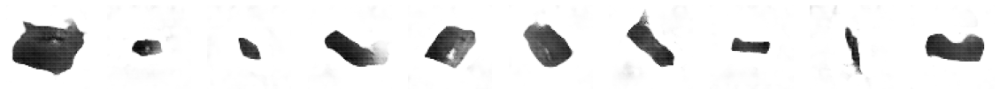

313/313 [==============================] - 654s 2s/step - d_loss: 6.6908 - d_real_acc: 0.1216 - d_fake_acc: 0.9972 - d_acc: 0.5594 - g_loss: 15.3750 - g_acc: 0.0028
Epoch 47/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_046.png


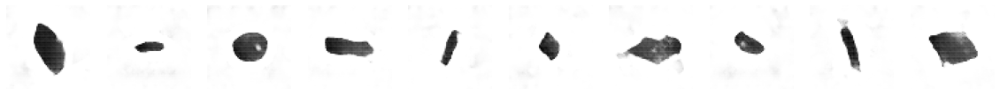

313/313 [==============================] - 653s 2s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 48/300
313/313 [==============================] - ETA: 0s - d_loss: 3.3451 - d_real_acc: 0.4518 - d_fake_acc: 0.7848 - d_acc: 0.6183 - g_loss: 7.1218 - g_acc: 0.2152
Saved to ./output/generated_img_047.png


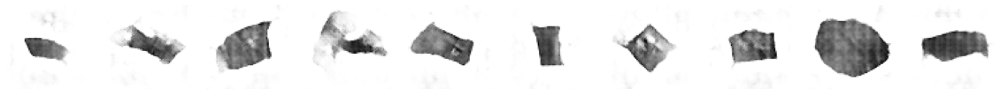

313/313 [==============================] - 655s 2s/step - d_loss: 3.3451 - d_real_acc: 0.4518 - d_fake_acc: 0.7848 - d_acc: 0.6183 - g_loss: 7.1218 - g_acc: 0.2152
Epoch 49/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2010 - d_real_acc: 0.8582 - d_fake_acc: 0.8572 - d_acc: 0.8577 - g_loss: 5.2939 - g_acc: 0.1428
Saved to ./output/generated_img_048.png


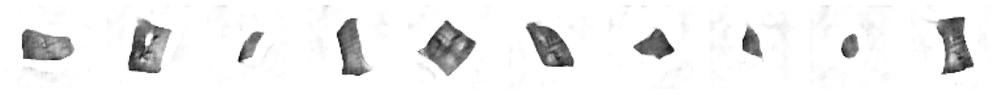

313/313 [==============================] - 658s 2s/step - d_loss: 0.2010 - d_real_acc: 0.8582 - d_fake_acc: 0.8572 - d_acc: 0.8577 - g_loss: 5.2939 - g_acc: 0.1428
Epoch 50/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3763 - d_real_acc: 0.9570 - d_fake_acc: 0.9585 - d_acc: 0.9577 - g_loss: 10.9657 - g_acc: 0.0415
Saved to ./output/generated_img_049.png


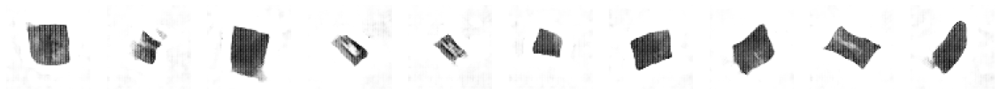

313/313 [==============================] - 657s 2s/step - d_loss: -0.3763 - d_real_acc: 0.9570 - d_fake_acc: 0.9585 - d_acc: 0.9577 - g_loss: 10.9657 - g_acc: 0.0415
Epoch 51/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2518 - d_real_acc: 0.9276 - d_fake_acc: 0.9359 - d_acc: 0.9318 - g_loss: 10.5567 - g_acc: 0.0640
Saved to ./output/generated_img_050.png


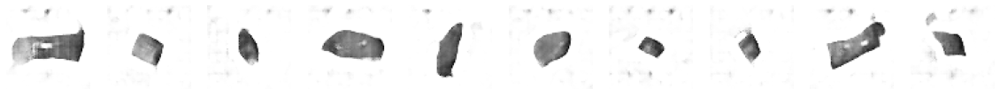

313/313 [==============================] - 664s 2s/step - d_loss: -0.2518 - d_real_acc: 0.9276 - d_fake_acc: 0.9359 - d_acc: 0.9318 - g_loss: 10.5567 - g_acc: 0.0640
Epoch 52/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2175 - d_real_acc: 0.9424 - d_fake_acc: 0.9457 - d_acc: 0.9441 - g_loss: 9.0412 - g_acc: 0.0543
Saved to ./output/generated_img_051.png


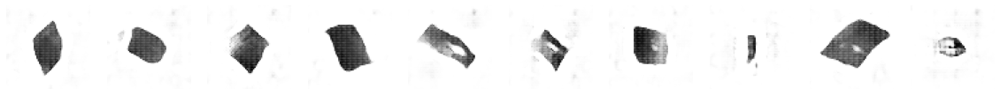

313/313 [==============================] - 657s 2s/step - d_loss: -0.2175 - d_real_acc: 0.9424 - d_fake_acc: 0.9457 - d_acc: 0.9441 - g_loss: 9.0412 - g_acc: 0.0543
Epoch 53/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7555 - d_real_acc: 0.9999 - d_fake_acc: 0.9995 - d_acc: 0.9997 - g_loss: 15.2177 - g_acc: 4.5000e-04
Saved to ./output/generated_img_052.png


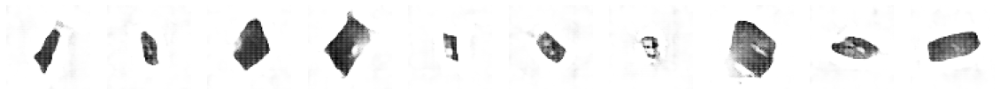

313/313 [==============================] - 653s 2s/step - d_loss: -0.7555 - d_real_acc: 0.9999 - d_fake_acc: 0.9995 - d_acc: 0.9997 - g_loss: 15.2177 - g_acc: 4.5000e-04
Epoch 54/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7655 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4245 - g_acc: 0.0000e+00
Saved to ./output/generated_img_053.png


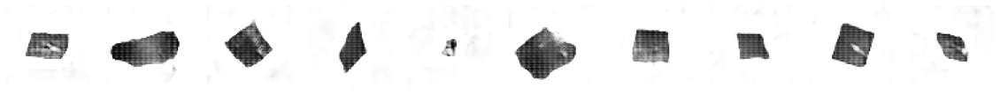

313/313 [==============================] - 651s 2s/step - d_loss: -0.7655 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4245 - g_acc: 0.0000e+00
Epoch 55/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2565 - d_real_acc: 0.9340 - d_fake_acc: 0.9393 - d_acc: 0.9366 - g_loss: 11.1485 - g_acc: 0.0607
Saved to ./output/generated_img_054.png


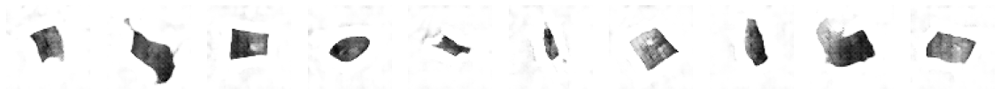

313/313 [==============================] - 654s 2s/step - d_loss: -0.2565 - d_real_acc: 0.9340 - d_fake_acc: 0.9393 - d_acc: 0.9366 - g_loss: 11.1485 - g_acc: 0.0607
Epoch 56/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3212 - d_real_acc: 0.9525 - d_fake_acc: 0.9583 - d_acc: 0.9554 - g_loss: 10.7707 - g_acc: 0.0417
Saved to ./output/generated_img_055.png


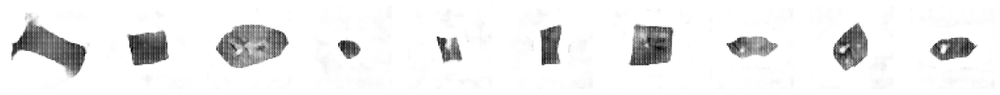

313/313 [==============================] - 700s 2s/step - d_loss: -0.3212 - d_real_acc: 0.9525 - d_fake_acc: 0.9583 - d_acc: 0.9554 - g_loss: 10.7707 - g_acc: 0.0417
Epoch 57/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7638 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4240 - g_acc: 0.0000e+00
Saved to ./output/generated_img_056.png


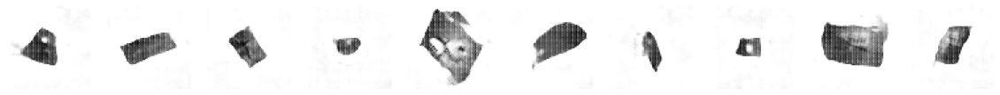

313/313 [==============================] - 657s 2s/step - d_loss: -0.7638 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4240 - g_acc: 0.0000e+00
Epoch 58/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1119 - d_real_acc: 0.9205 - d_fake_acc: 0.9244 - d_acc: 0.9225 - g_loss: 8.6438 - g_acc: 0.0756
Saved to ./output/generated_img_057.png


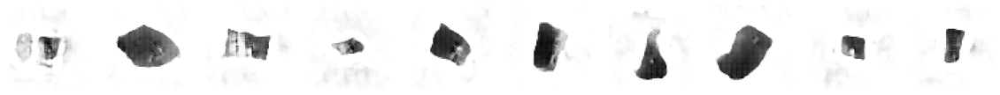

313/313 [==============================] - 656s 2s/step - d_loss: -0.1119 - d_real_acc: 0.9205 - d_fake_acc: 0.9244 - d_acc: 0.9225 - g_loss: 8.6438 - g_acc: 0.0756
Epoch 59/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2885 - d_real_acc: 0.9562 - d_fake_acc: 0.9581 - d_acc: 0.9571 - g_loss: 9.1167 - g_acc: 0.0419
Saved to ./output/generated_img_058.png


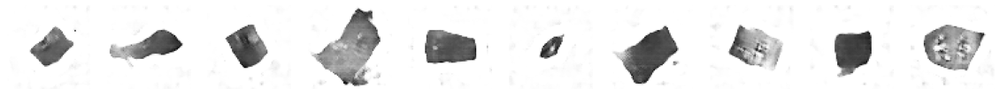

313/313 [==============================] - 656s 2s/step - d_loss: -0.2885 - d_real_acc: 0.9562 - d_fake_acc: 0.9581 - d_acc: 0.9571 - g_loss: 9.1167 - g_acc: 0.0419
Epoch 60/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2779 - d_real_acc: 0.9579 - d_fake_acc: 0.9610 - d_acc: 0.9595 - g_loss: 8.9456 - g_acc: 0.0390
Saved to ./output/generated_img_059.png


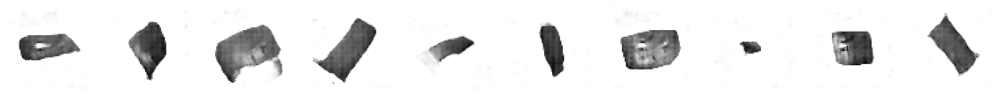

313/313 [==============================] - 660s 2s/step - d_loss: -0.2779 - d_real_acc: 0.9579 - d_fake_acc: 0.9610 - d_acc: 0.9595 - g_loss: 8.9456 - g_acc: 0.0390
Epoch 61/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2197 - d_real_acc: 0.9489 - d_fake_acc: 0.9517 - d_acc: 0.9503 - g_loss: 8.3358 - g_acc: 0.0483
Saved to ./output/generated_img_060.png


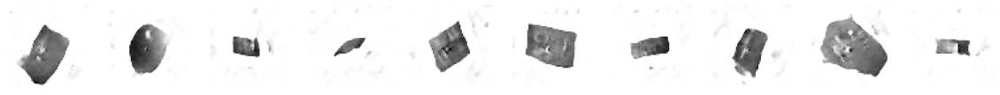

313/313 [==============================] - 655s 2s/step - d_loss: -0.2197 - d_real_acc: 0.9489 - d_fake_acc: 0.9517 - d_acc: 0.9503 - g_loss: 8.3358 - g_acc: 0.0483
Epoch 62/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3074 - d_real_acc: 0.9588 - d_fake_acc: 0.9609 - d_acc: 0.9599 - g_loss: 9.2094 - g_acc: 0.0391
Saved to ./output/generated_img_061.png


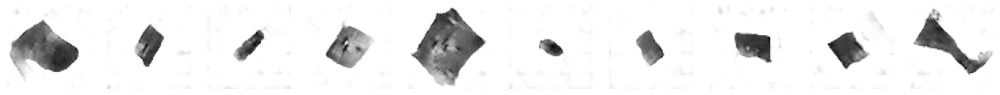

313/313 [==============================] - 657s 2s/step - d_loss: -0.3074 - d_real_acc: 0.9588 - d_fake_acc: 0.9609 - d_acc: 0.9599 - g_loss: 9.2094 - g_acc: 0.0391
Epoch 63/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3012 - d_real_acc: 0.9560 - d_fake_acc: 0.9605 - d_acc: 0.9583 - g_loss: 9.5765 - g_acc: 0.0395
Saved to ./output/generated_img_062.png


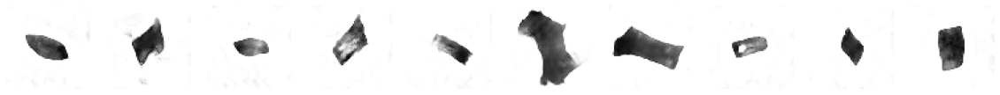

313/313 [==============================] - 657s 2s/step - d_loss: -0.3012 - d_real_acc: 0.9560 - d_fake_acc: 0.9605 - d_acc: 0.9583 - g_loss: 9.5765 - g_acc: 0.0395
Epoch 64/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3046 - d_real_acc: 0.9515 - d_fake_acc: 0.9535 - d_acc: 0.9525 - g_loss: 9.8309 - g_acc: 0.0465
Saved to ./output/generated_img_063.png


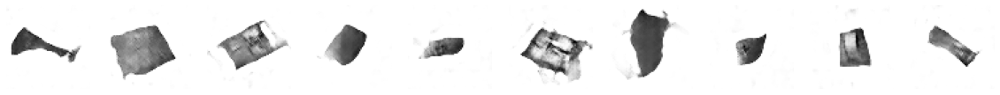

313/313 [==============================] - 654s 2s/step - d_loss: -0.3046 - d_real_acc: 0.9515 - d_fake_acc: 0.9535 - d_acc: 0.9525 - g_loss: 9.8309 - g_acc: 0.0465
Epoch 65/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4267 - d_real_acc: 0.9700 - d_fake_acc: 0.9697 - d_acc: 0.9699 - g_loss: 10.8021 - g_acc: 0.0303
Saved to ./output/generated_img_064.png


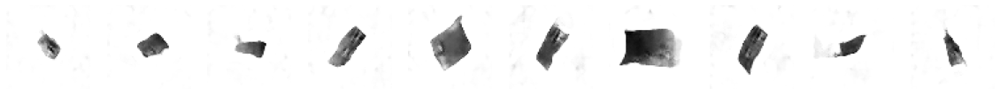

313/313 [==============================] - 656s 2s/step - d_loss: -0.4267 - d_real_acc: 0.9700 - d_fake_acc: 0.9697 - d_acc: 0.9699 - g_loss: 10.8021 - g_acc: 0.0303
Epoch 66/300
313/313 [==============================] - ETA: 0s - d_loss: 1.9362 - d_real_acc: 0.6892 - d_fake_acc: 0.9656 - d_acc: 0.8274 - g_loss: 11.0640 - g_acc: 0.0344
Saved to ./output/generated_img_065.png


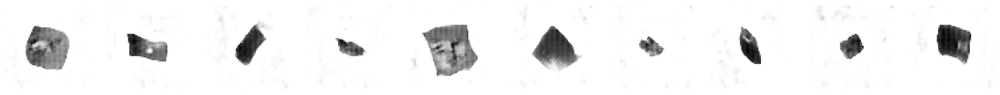

313/313 [==============================] - 654s 2s/step - d_loss: 1.9362 - d_real_acc: 0.6892 - d_fake_acc: 0.9656 - d_acc: 0.8274 - g_loss: 11.0640 - g_acc: 0.0344
Epoch 67/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2608 - d_real_acc: 0.9527 - d_fake_acc: 0.9528 - d_acc: 0.9528 - g_loss: 9.1821 - g_acc: 0.0472
Saved to ./output/generated_img_066.png


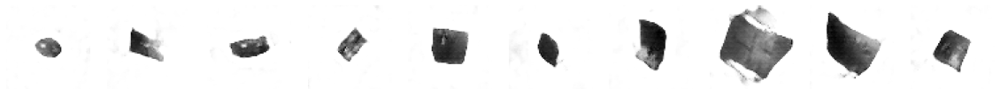

313/313 [==============================] - 657s 2s/step - d_loss: -0.2608 - d_real_acc: 0.9527 - d_fake_acc: 0.9528 - d_acc: 0.9528 - g_loss: 9.1821 - g_acc: 0.0472
Epoch 68/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3283 - d_real_acc: 0.9521 - d_fake_acc: 0.9554 - d_acc: 0.9538 - g_loss: 10.3497 - g_acc: 0.0446
Saved to ./output/generated_img_067.png


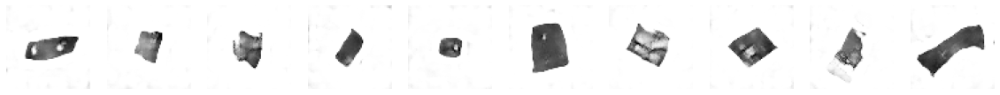

313/313 [==============================] - 695s 2s/step - d_loss: -0.3283 - d_real_acc: 0.9521 - d_fake_acc: 0.9554 - d_acc: 0.9538 - g_loss: 10.3497 - g_acc: 0.0446
Epoch 69/300
313/313 [==============================] - ETA: 0s - d_loss: -0.5507 - d_real_acc: 0.9840 - d_fake_acc: 0.9847 - d_acc: 0.9843 - g_loss: 12.1965 - g_acc: 0.0153
Saved to ./output/generated_img_068.png


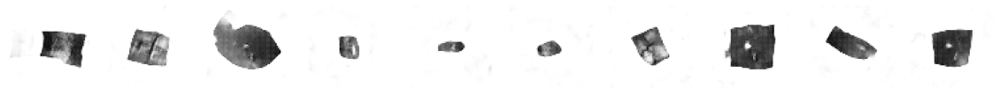

313/313 [==============================] - 658s 2s/step - d_loss: -0.5507 - d_real_acc: 0.9840 - d_fake_acc: 0.9847 - d_acc: 0.9843 - g_loss: 12.1965 - g_acc: 0.0153
Epoch 70/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2437 - d_real_acc: 0.9324 - d_fake_acc: 0.8888 - d_acc: 0.9106 - g_loss: 8.9174 - g_acc: 0.1112
Saved to ./output/generated_img_069.png


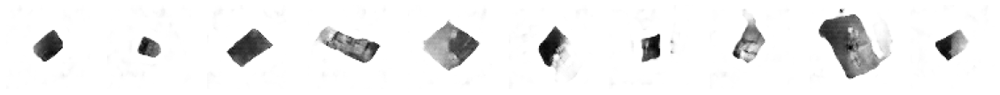

313/313 [==============================] - 657s 2s/step - d_loss: 0.2437 - d_real_acc: 0.9324 - d_fake_acc: 0.8888 - d_acc: 0.9106 - g_loss: 8.9174 - g_acc: 0.1112
Epoch 71/300
313/313 [==============================] - ETA: 0s - d_loss: 2.2526 - d_real_acc: 0.9611 - d_fake_acc: 0.6492 - d_acc: 0.8051 - g_loss: 6.3610 - g_acc: 0.3508
Saved to ./output/generated_img_070.png


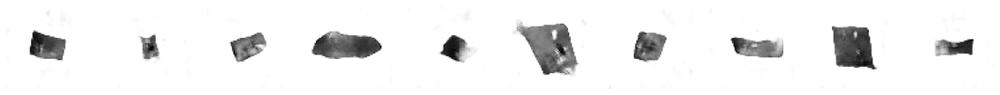

313/313 [==============================] - 656s 2s/step - d_loss: 2.2526 - d_real_acc: 0.9611 - d_fake_acc: 0.6492 - d_acc: 0.8051 - g_loss: 6.3610 - g_acc: 0.3508
Epoch 72/300
313/313 [==============================] - ETA: 0s - d_loss: -0.6912 - d_real_acc: 0.9937 - d_fake_acc: 0.9940 - d_acc: 0.9938 - g_loss: 14.3191 - g_acc: 0.0060
Saved to ./output/generated_img_071.png


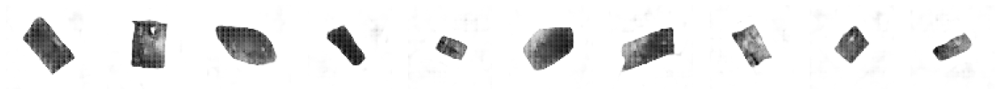

313/313 [==============================] - 663s 2s/step - d_loss: -0.6912 - d_real_acc: 0.9937 - d_fake_acc: 0.9940 - d_acc: 0.9938 - g_loss: 14.3191 - g_acc: 0.0060
Epoch 73/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3023 - d_real_acc: 0.9486 - d_fake_acc: 0.9501 - d_acc: 0.9493 - g_loss: 10.7763 - g_acc: 0.0499
Saved to ./output/generated_img_072.png


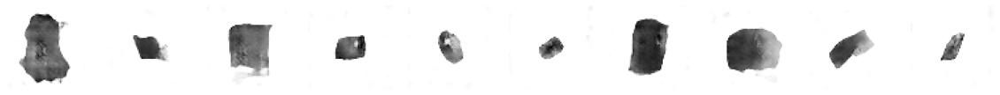

313/313 [==============================] - 663s 2s/step - d_loss: -0.3023 - d_real_acc: 0.9486 - d_fake_acc: 0.9501 - d_acc: 0.9493 - g_loss: 10.7763 - g_acc: 0.0499
Epoch 74/300
313/313 [==============================] - ETA: 0s - d_loss: -0.6516 - d_real_acc: 0.9881 - d_fake_acc: 0.9884 - d_acc: 0.9883 - g_loss: 13.8480 - g_acc: 0.0116
Saved to ./output/generated_img_073.png


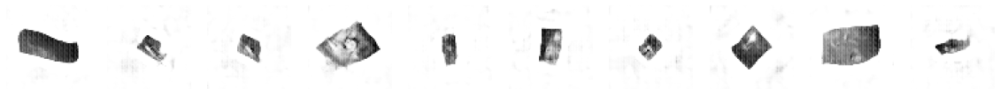

313/313 [==============================] - 657s 2s/step - d_loss: -0.6516 - d_real_acc: 0.9881 - d_fake_acc: 0.9884 - d_acc: 0.9883 - g_loss: 13.8480 - g_acc: 0.0116
Epoch 75/300
313/313 [==============================] - ETA: 0s - d_loss: -0.6489 - d_real_acc: 0.9857 - d_fake_acc: 0.9856 - d_acc: 0.9856 - g_loss: 14.3400 - g_acc: 0.0144
Saved to ./output/generated_img_074.png


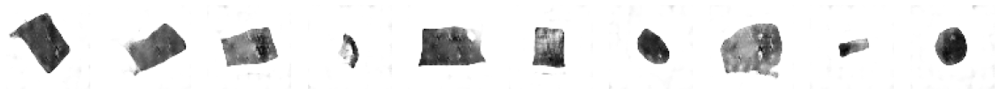

313/313 [==============================] - 655s 2s/step - d_loss: -0.6489 - d_real_acc: 0.9857 - d_fake_acc: 0.9856 - d_acc: 0.9856 - g_loss: 14.3400 - g_acc: 0.0144
Epoch 76/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2956 - d_real_acc: 0.9522 - d_fake_acc: 0.9572 - d_acc: 0.9547 - g_loss: 10.2673 - g_acc: 0.0428
Saved to ./output/generated_img_075.png


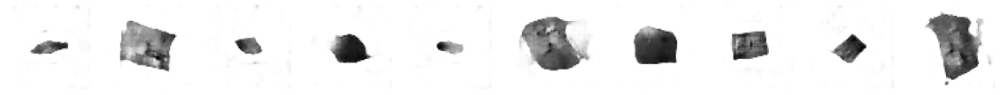

313/313 [==============================] - 657s 2s/step - d_loss: -0.2956 - d_real_acc: 0.9522 - d_fake_acc: 0.9572 - d_acc: 0.9547 - g_loss: 10.2673 - g_acc: 0.0428
Epoch 77/300
313/313 [==============================] - ETA: 0s - d_loss: -0.6501 - d_real_acc: 0.9880 - d_fake_acc: 0.9885 - d_acc: 0.9883 - g_loss: 13.9238 - g_acc: 0.0115
Saved to ./output/generated_img_076.png


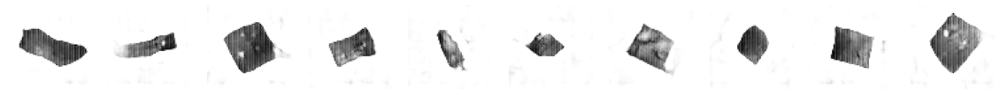

313/313 [==============================] - 656s 2s/step - d_loss: -0.6501 - d_real_acc: 0.9880 - d_fake_acc: 0.9885 - d_acc: 0.9883 - g_loss: 13.9238 - g_acc: 0.0115
Epoch 78/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1887 - d_real_acc: 0.9312 - d_fake_acc: 0.9635 - d_acc: 0.9473 - g_loss: 13.2000 - g_acc: 0.0365
Saved to ./output/generated_img_077.png


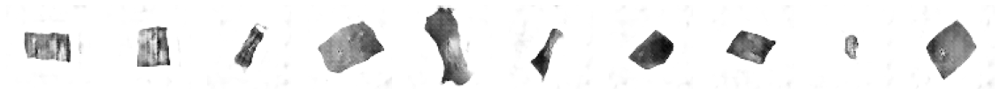

313/313 [==============================] - 653s 2s/step - d_loss: -0.1887 - d_real_acc: 0.9312 - d_fake_acc: 0.9635 - d_acc: 0.9473 - g_loss: 13.2000 - g_acc: 0.0365
Epoch 79/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3652 - d_real_acc: 0.9563 - d_fake_acc: 0.9727 - d_acc: 0.9645 - g_loss: 12.7713 - g_acc: 0.0273
Saved to ./output/generated_img_078.png


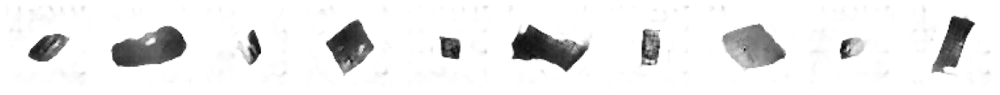

313/313 [==============================] - 656s 2s/step - d_loss: -0.3652 - d_real_acc: 0.9563 - d_fake_acc: 0.9727 - d_acc: 0.9645 - g_loss: 12.7713 - g_acc: 0.0273
Epoch 80/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1368 - d_real_acc: 0.8993 - d_fake_acc: 0.9359 - d_acc: 0.9176 - g_loss: 9.6176 - g_acc: 0.0641
Saved to ./output/generated_img_079.png


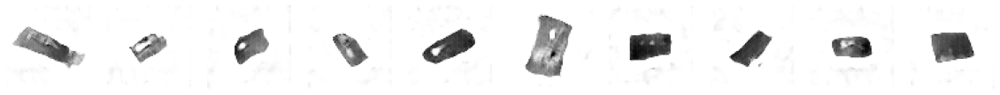

313/313 [==============================] - 692s 2s/step - d_loss: 0.1368 - d_real_acc: 0.8993 - d_fake_acc: 0.9359 - d_acc: 0.9176 - g_loss: 9.6176 - g_acc: 0.0641
Epoch 81/300
313/313 [==============================] - ETA: 0s - d_loss: -0.5673 - d_real_acc: 0.9833 - d_fake_acc: 0.9841 - d_acc: 0.9837 - g_loss: 12.8702 - g_acc: 0.0159
Saved to ./output/generated_img_080.png


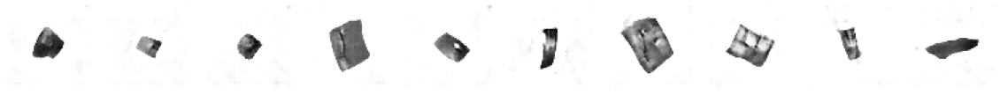

313/313 [==============================] - 656s 2s/step - d_loss: -0.5673 - d_real_acc: 0.9833 - d_fake_acc: 0.9841 - d_acc: 0.9837 - g_loss: 12.8702 - g_acc: 0.0159
Epoch 82/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3651 - d_real_acc: 0.9607 - d_fake_acc: 0.9613 - d_acc: 0.9610 - g_loss: 11.7161 - g_acc: 0.0387
Saved to ./output/generated_img_081.png


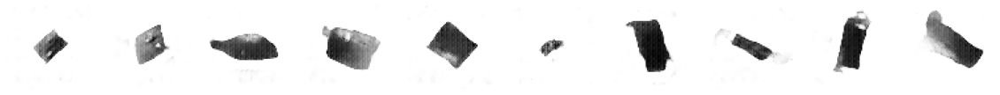

313/313 [==============================] - 655s 2s/step - d_loss: -0.3651 - d_real_acc: 0.9607 - d_fake_acc: 0.9613 - d_acc: 0.9610 - g_loss: 11.7161 - g_acc: 0.0387
Epoch 83/300
313/313 [==============================] - ETA: 0s - d_loss: -0.6768 - d_real_acc: 0.9906 - d_fake_acc: 0.9913 - d_acc: 0.9910 - g_loss: 14.3340 - g_acc: 0.0087
Saved to ./output/generated_img_082.png


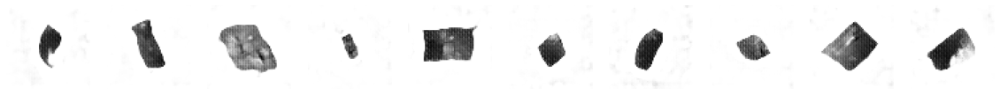

313/313 [==============================] - 654s 2s/step - d_loss: -0.6768 - d_real_acc: 0.9906 - d_fake_acc: 0.9913 - d_acc: 0.9910 - g_loss: 14.3340 - g_acc: 0.0087
Epoch 84/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7655 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4246 - g_acc: 0.0000e+00
Saved to ./output/generated_img_083.png


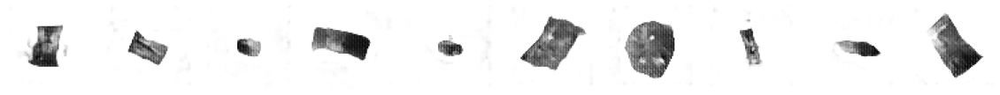

313/313 [==============================] - 654s 2s/step - d_loss: -0.7655 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4246 - g_acc: 0.0000e+00
Epoch 85/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7663 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Saved to ./output/generated_img_084.png


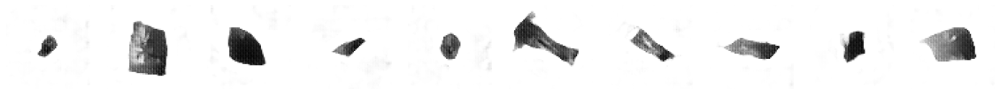

313/313 [==============================] - 654s 2s/step - d_loss: -0.7663 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Epoch 86/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7686 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4241 - g_acc: 0.0000e+00
Saved to ./output/generated_img_085.png


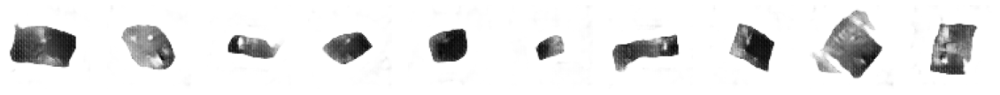

313/313 [==============================] - 651s 2s/step - d_loss: -0.7686 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4241 - g_acc: 0.0000e+00
Epoch 87/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7653 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.3823 - g_acc: 0.0000e+00
Saved to ./output/generated_img_086.png


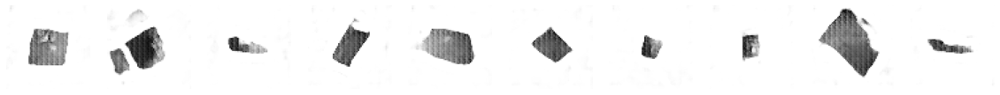

313/313 [==============================] - 651s 2s/step - d_loss: -0.7653 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.3823 - g_acc: 0.0000e+00
Epoch 88/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7649 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4243 - g_acc: 0.0000e+00
Saved to ./output/generated_img_087.png


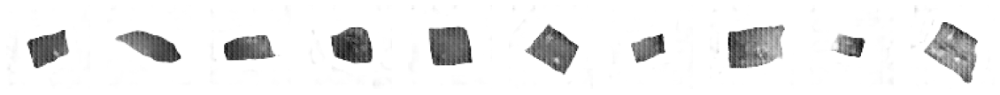

313/313 [==============================] - 653s 2s/step - d_loss: -0.7649 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4243 - g_acc: 0.0000e+00
Epoch 89/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7671 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4241 - g_acc: 0.0000e+00
Saved to ./output/generated_img_088.png


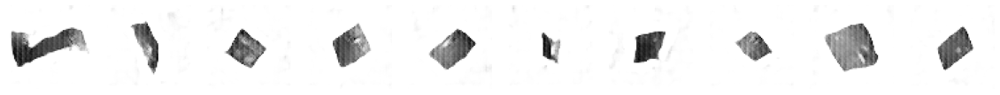

313/313 [==============================] - 665s 2s/step - d_loss: -0.7671 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4241 - g_acc: 0.0000e+00
Epoch 90/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7647 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4162 - g_acc: 0.0000e+00
Saved to ./output/generated_img_089.png


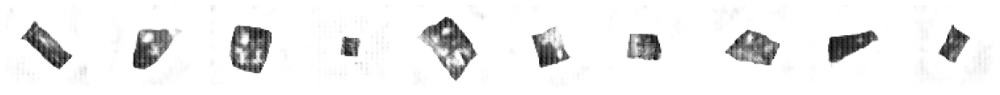

313/313 [==============================] - 656s 2s/step - d_loss: -0.7647 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4162 - g_acc: 0.0000e+00
Epoch 91/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7653 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Saved to ./output/generated_img_090.png


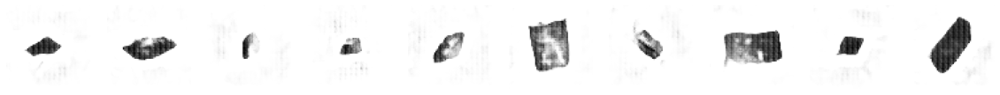

313/313 [==============================] - 656s 2s/step - d_loss: -0.7653 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4248 - g_acc: 0.0000e+00
Epoch 92/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7668 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Saved to ./output/generated_img_091.png


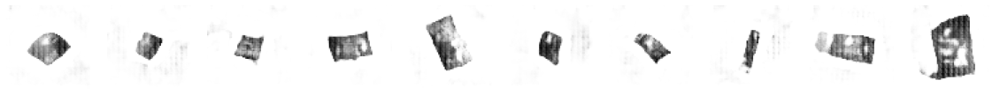

313/313 [==============================] - 1629s 5s/step - d_loss: -0.7668 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Epoch 93/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7668 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Saved to ./output/generated_img_092.png


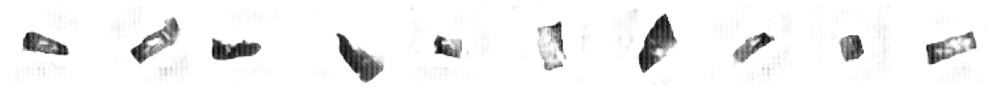

313/313 [==============================] - 655s 2s/step - d_loss: -0.7668 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4249 - g_acc: 0.0000e+00
Epoch 94/300
313/313 [==============================] - ETA: 0s - d_loss: -0.7642 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4199 - g_acc: 0.0000e+00
Saved to ./output/generated_img_093.png


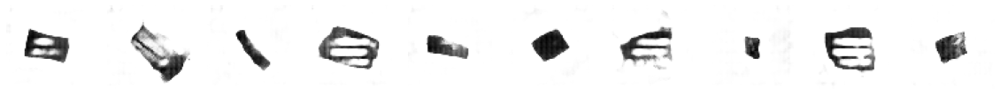

313/313 [==============================] - 655s 2s/step - d_loss: -0.7642 - d_real_acc: 1.0000 - d_fake_acc: 1.0000 - d_acc: 1.0000 - g_loss: 15.4199 - g_acc: 0.0000e+00
Epoch 95/300
313/313 [==============================] - ETA: 0s - d_loss: 7.0693 - d_real_acc: 0.0961 - d_fake_acc: 0.9777 - d_acc: 0.5369 - g_loss: 15.0590 - g_acc: 0.0223
Saved to ./output/generated_img_094.png


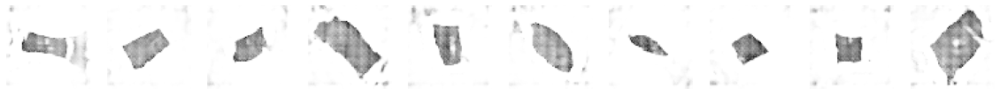

313/313 [==============================] - 656s 2s/step - d_loss: 7.0693 - d_real_acc: 0.0961 - d_fake_acc: 0.9777 - d_acc: 0.5369 - g_loss: 15.0590 - g_acc: 0.0223
Epoch 96/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7101 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_095.png


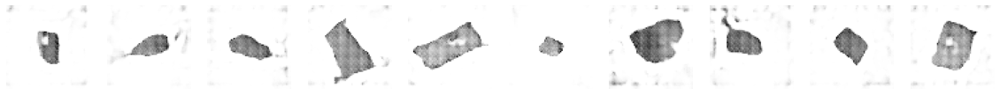

313/313 [==============================] - 655s 2s/step - d_loss: 7.7101 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 97/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_096.png


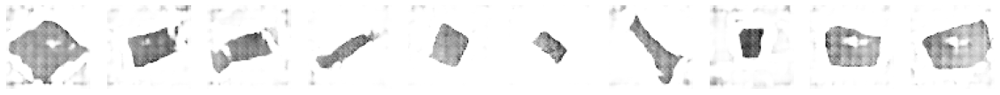

313/313 [==============================] - 656s 2s/step - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 98/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7100 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_097.png


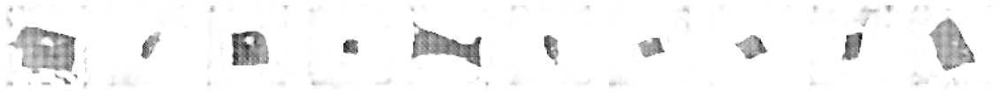

313/313 [==============================] - 654s 2s/step - d_loss: 7.7100 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 99/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_098.png


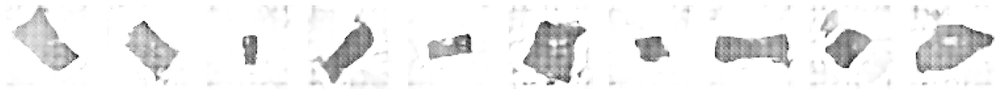

313/313 [==============================] - 654s 2s/step - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 100/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7164 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_099.png


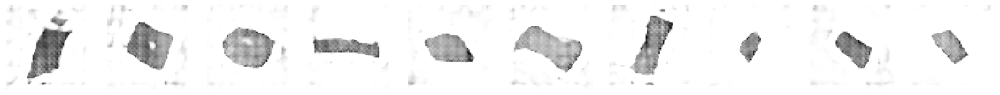

313/313 [==============================] - 656s 2s/step - d_loss: 7.7164 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 101/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_100.png


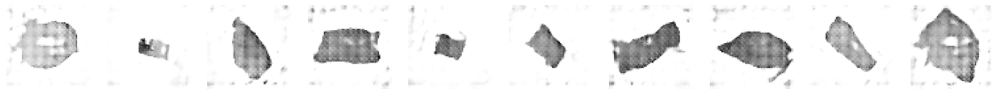

313/313 [==============================] - 656s 2s/step - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 102/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7140 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_101.png


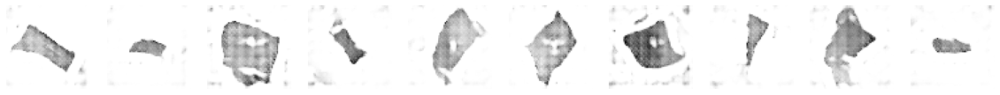

313/313 [==============================] - 656s 2s/step - d_loss: 7.7140 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 103/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7121 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_102.png


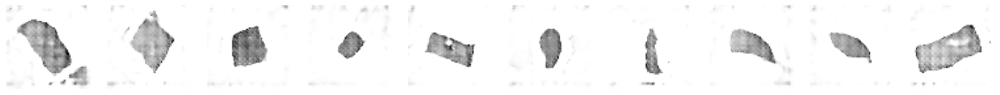

313/313 [==============================] - 1255s 4s/step - d_loss: 7.7121 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 104/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_103.png


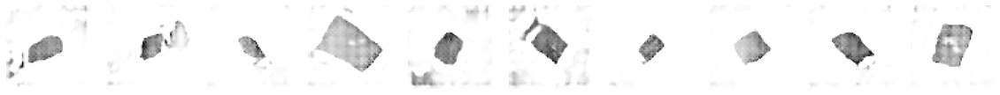

313/313 [==============================] - 668s 2s/step - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 105/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_104.png


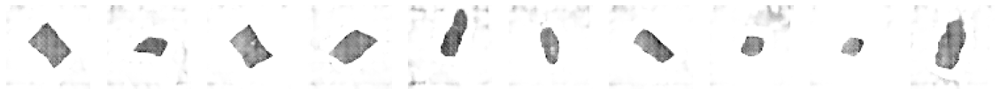

313/313 [==============================] - 657s 2s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 106/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_105.png


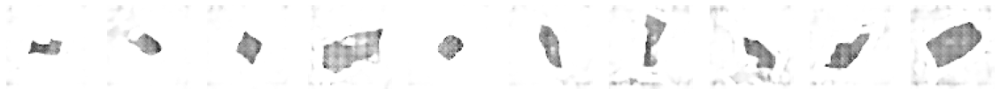

313/313 [==============================] - 656s 2s/step - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 107/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_106.png


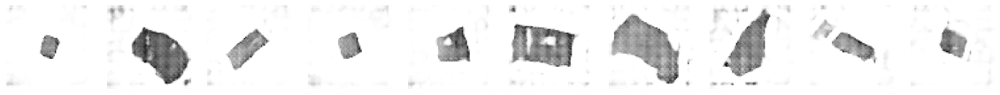

313/313 [==============================] - 655s 2s/step - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 108/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_107.png


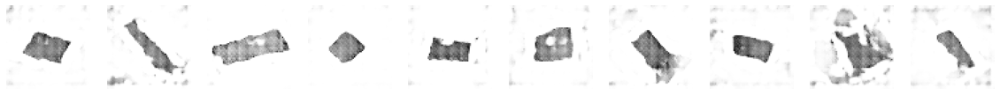

313/313 [==============================] - 656s 2s/step - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 109/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_108.png


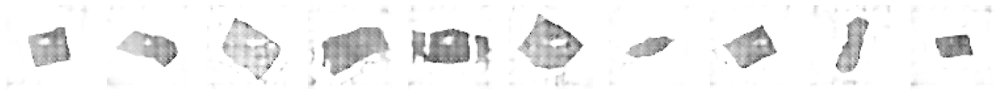

313/313 [==============================] - 655s 2s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 110/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7112 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_109.png


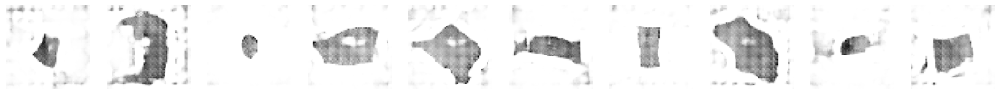

313/313 [==============================] - 656s 2s/step - d_loss: 7.7112 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 111/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_110.png


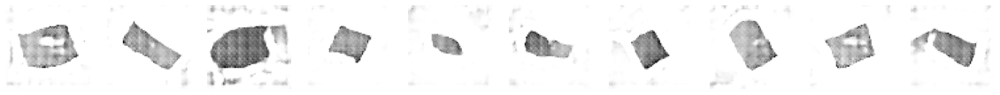

313/313 [==============================] - 655s 2s/step - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 112/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_111.png


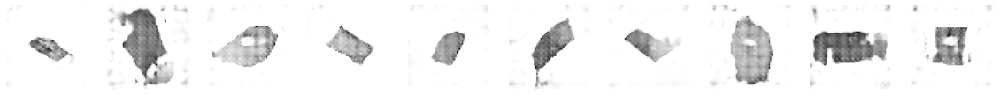

313/313 [==============================] - 655s 2s/step - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 113/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_112.png


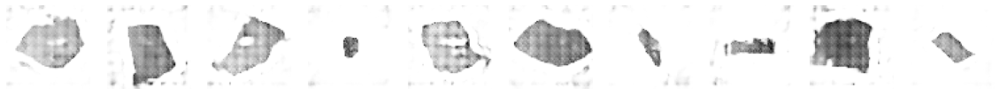

313/313 [==============================] - 655s 2s/step - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 114/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7114 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_113.png


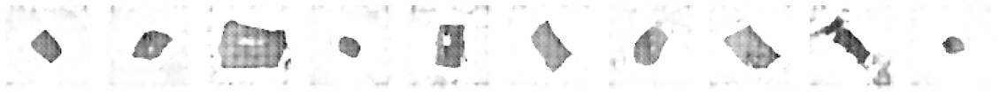

313/313 [==============================] - 657s 2s/step - d_loss: 7.7114 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 115/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7121 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_114.png


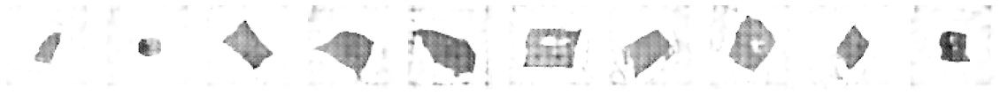

313/313 [==============================] - 768s 2s/step - d_loss: 7.7121 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 116/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_115.png


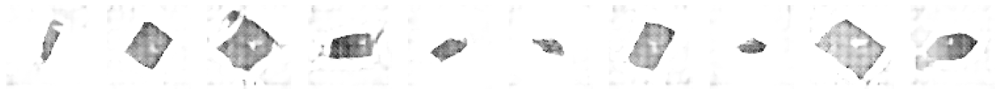

313/313 [==============================] - 654s 2s/step - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 117/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7132 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_116.png


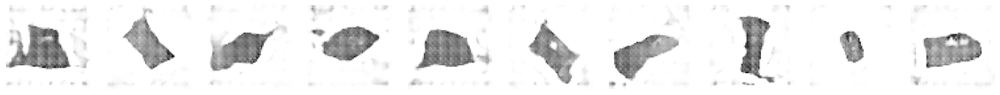

313/313 [==============================] - 656s 2s/step - d_loss: 7.7132 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 118/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_117.png


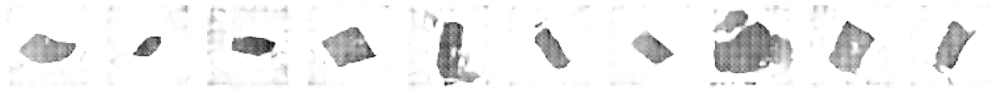

313/313 [==============================] - 656s 2s/step - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 119/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_118.png


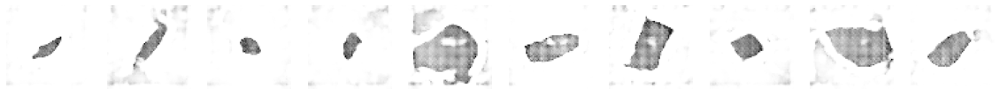

313/313 [==============================] - 655s 2s/step - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 120/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_119.png


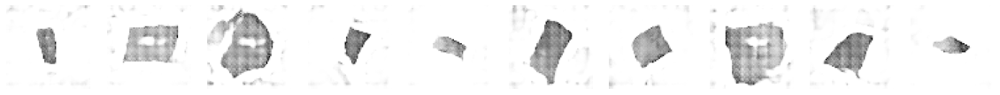

313/313 [==============================] - 656s 2s/step - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 121/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_120.png


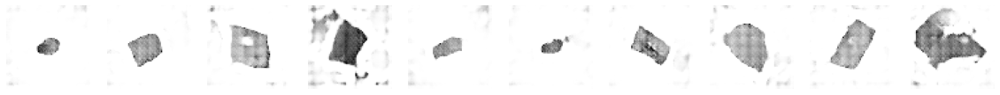

313/313 [==============================] - 658s 2s/step - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 122/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_121.png


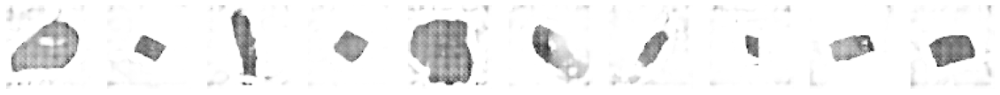

313/313 [==============================] - 655s 2s/step - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 123/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7114 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_122.png


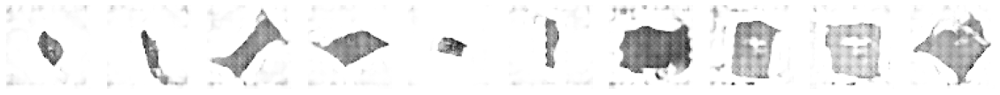

313/313 [==============================] - 658s 2s/step - d_loss: 7.7114 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 124/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_123.png


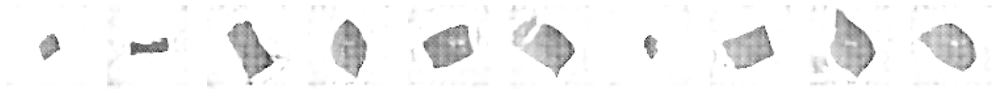

313/313 [==============================] - 654s 2s/step - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 125/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7119 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_124.png


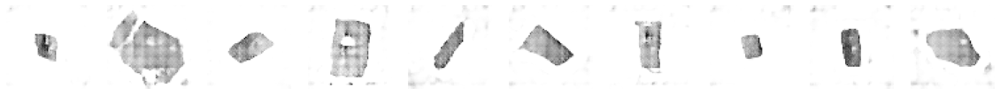

313/313 [==============================] - 657s 2s/step - d_loss: 7.7119 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 126/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_125.png


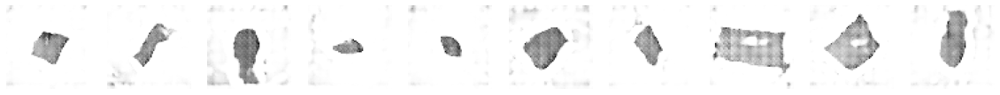

313/313 [==============================] - 711s 2s/step - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 127/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_126.png


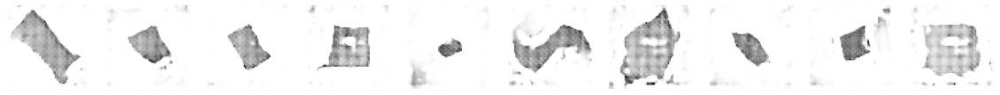

313/313 [==============================] - 656s 2s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 128/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_127.png


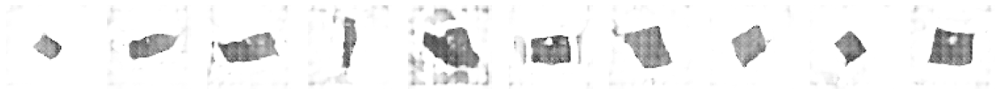

313/313 [==============================] - 656s 2s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 129/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7152 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_128.png


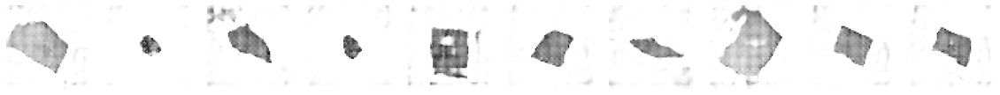

313/313 [==============================] - 655s 2s/step - d_loss: 7.7152 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 130/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7132 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_129.png


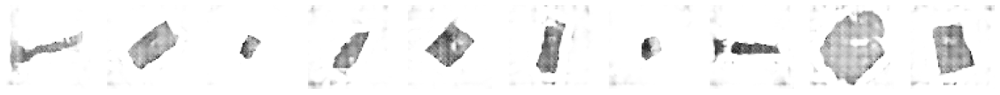

313/313 [==============================] - 654s 2s/step - d_loss: 7.7132 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 131/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7099 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_130.png


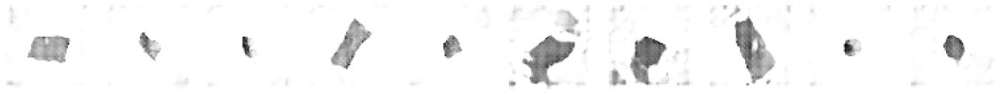

313/313 [==============================] - 654s 2s/step - d_loss: 7.7099 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 132/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_131.png


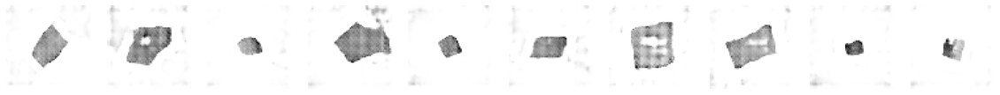

313/313 [==============================] - 656s 2s/step - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 133/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7092 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_132.png


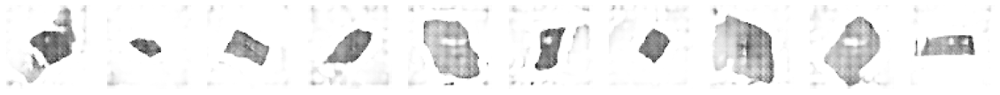

313/313 [==============================] - 656s 2s/step - d_loss: 7.7092 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 134/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_133.png


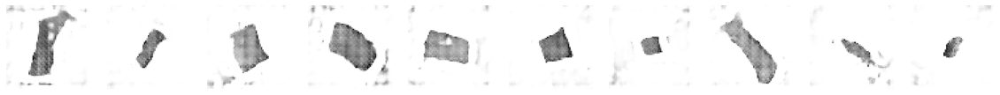

313/313 [==============================] - 656s 2s/step - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 135/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_134.png


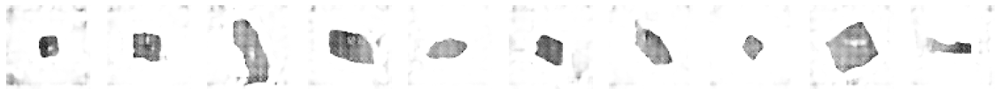

313/313 [==============================] - 655s 2s/step - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 136/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7103 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_135.png


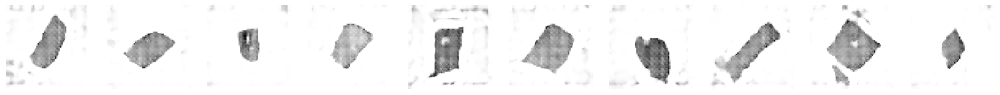

313/313 [==============================] - 655s 2s/step - d_loss: 7.7103 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 137/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_136.png


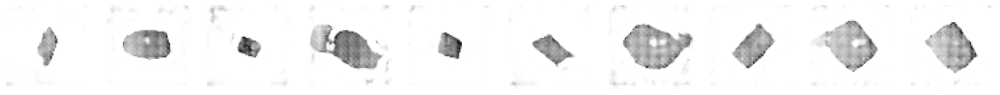

313/313 [==============================] - 657s 2s/step - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 138/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_137.png


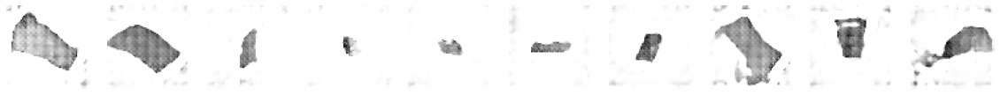

313/313 [==============================] - 788s 3s/step - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 139/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7104 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_138.png


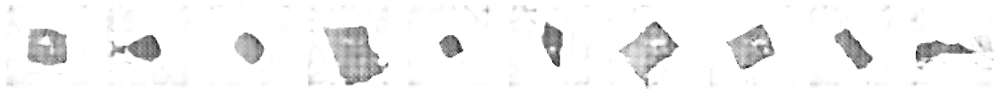

313/313 [==============================] - 656s 2s/step - d_loss: 7.7104 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 140/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_139.png


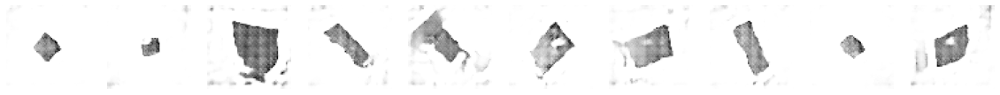

313/313 [==============================] - 655s 2s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 141/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7118 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_140.png


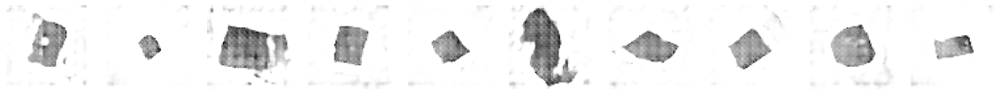

313/313 [==============================] - 656s 2s/step - d_loss: 7.7118 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 142/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_141.png


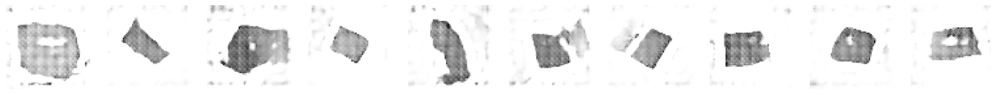

313/313 [==============================] - 655s 2s/step - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 143/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7109 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_142.png


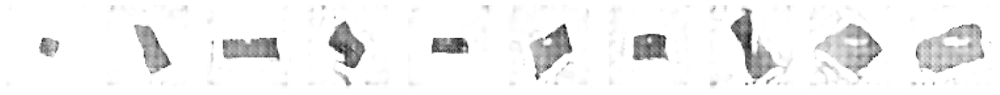

313/313 [==============================] - 657s 2s/step - d_loss: 7.7109 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 144/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7143 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_143.png


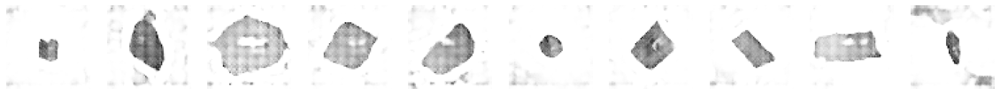

313/313 [==============================] - 659s 2s/step - d_loss: 7.7143 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 145/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_144.png


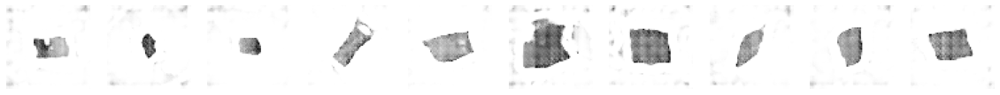

313/313 [==============================] - 655s 2s/step - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 146/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_145.png


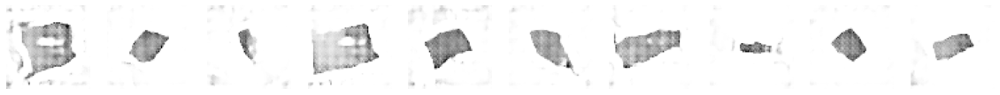

313/313 [==============================] - 654s 2s/step - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 147/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_146.png


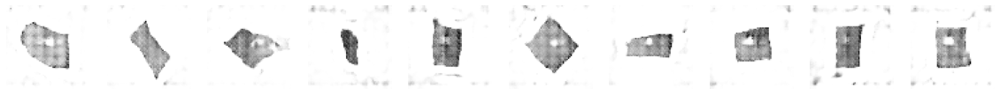

313/313 [==============================] - 658s 2s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 148/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_147.png


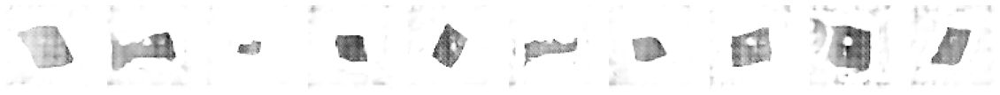

313/313 [==============================] - 661s 2s/step - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 149/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_148.png


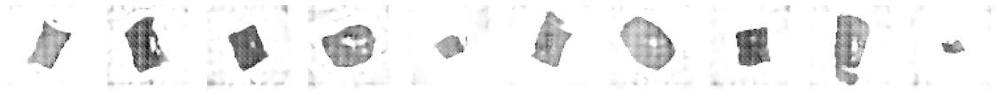

313/313 [==============================] - 891s 3s/step - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 150/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7084 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_149.png


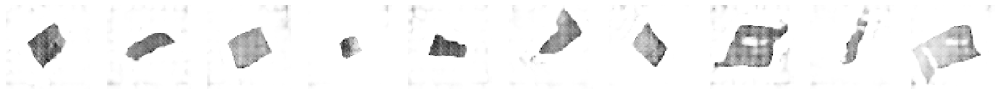

313/313 [==============================] - 656s 2s/step - d_loss: 7.7084 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 151/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_150.png


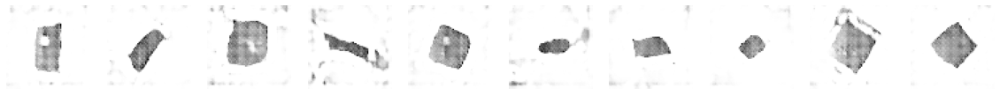

313/313 [==============================] - 655s 2s/step - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 152/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_151.png


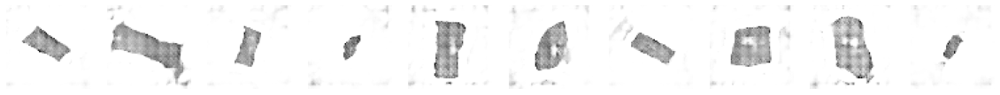

313/313 [==============================] - 655s 2s/step - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 153/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7161 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_152.png


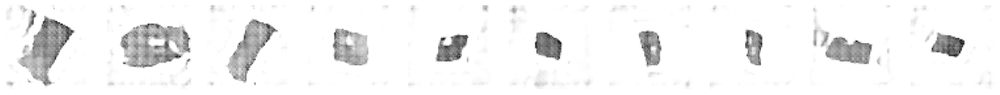

313/313 [==============================] - 656s 2s/step - d_loss: 7.7161 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 154/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_153.png


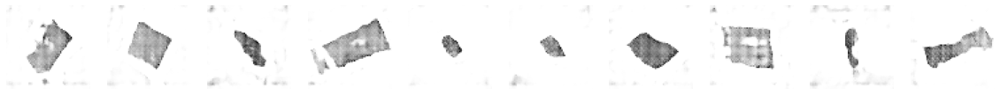

313/313 [==============================] - 655s 2s/step - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 155/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_154.png


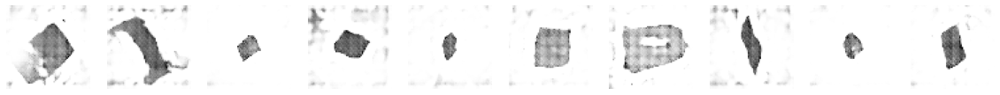

313/313 [==============================] - 654s 2s/step - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 156/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_155.png


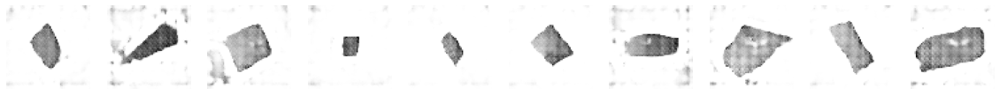

313/313 [==============================] - 656s 2s/step - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 157/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_156.png


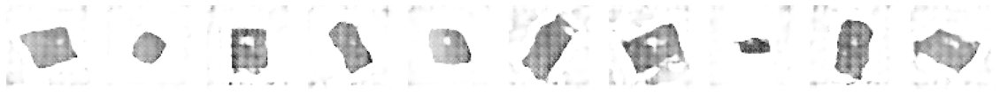

313/313 [==============================] - 655s 2s/step - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 158/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_157.png


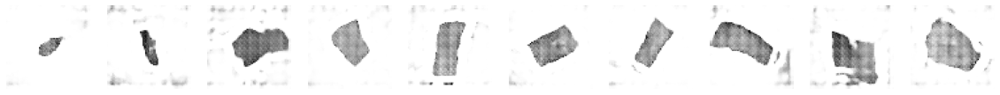

313/313 [==============================] - 654s 2s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 159/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_158.png


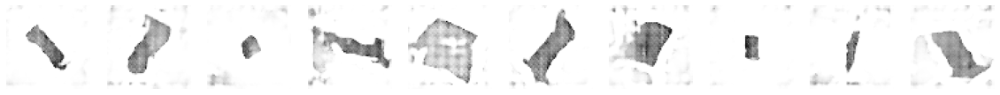

313/313 [==============================] - 656s 2s/step - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 160/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_159.png


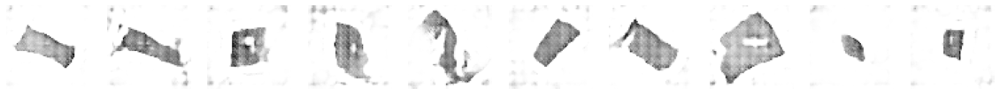

313/313 [==============================] - 655s 2s/step - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 161/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_160.png


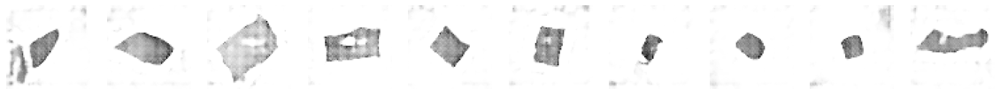

313/313 [==============================] - 1354s 4s/step - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 162/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7111 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_161.png


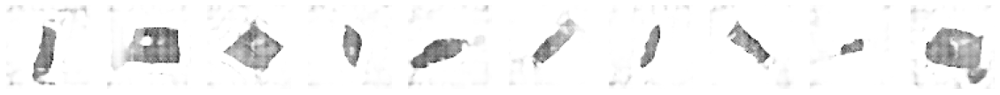

313/313 [==============================] - 655s 2s/step - d_loss: 7.7111 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 163/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7126 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_162.png


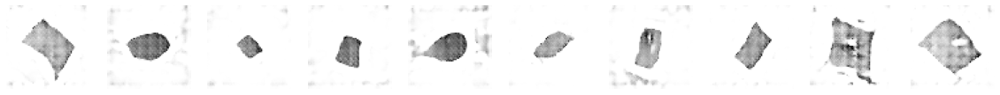

313/313 [==============================] - 655s 2s/step - d_loss: 7.7126 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 164/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7110 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_163.png


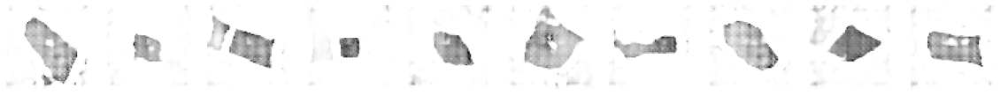

313/313 [==============================] - 654s 2s/step - d_loss: 7.7110 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 165/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_164.png


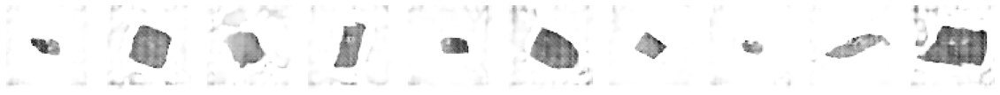

313/313 [==============================] - 656s 2s/step - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 166/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_165.png


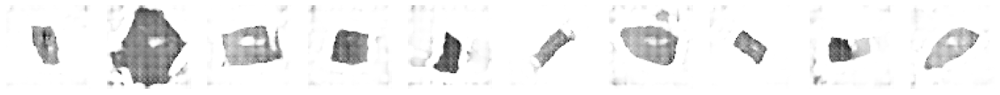

313/313 [==============================] - 655s 2s/step - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 167/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_166.png


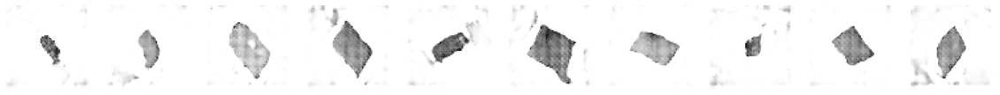

313/313 [==============================] - 657s 2s/step - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 168/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_167.png


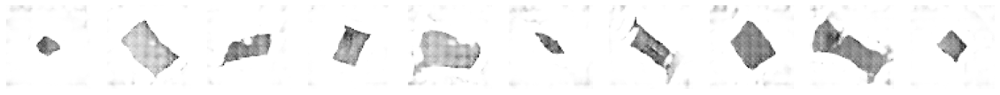

313/313 [==============================] - 656s 2s/step - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 169/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_168.png


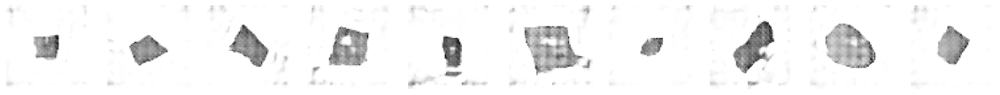

313/313 [==============================] - 655s 2s/step - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 170/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_169.png


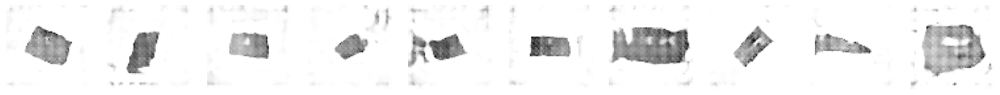

313/313 [==============================] - 656s 2s/step - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 171/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_170.png


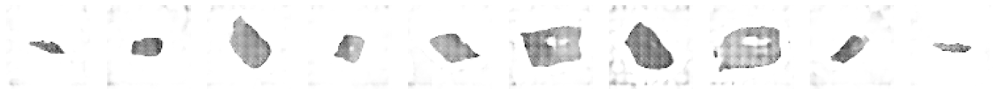

313/313 [==============================] - 656s 2s/step - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 172/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_171.png


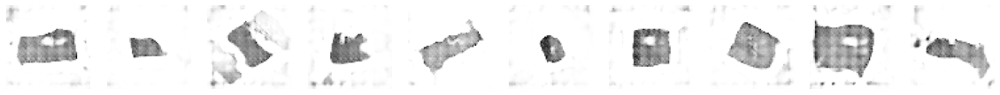

313/313 [==============================] - 1181s 4s/step - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 173/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_172.png


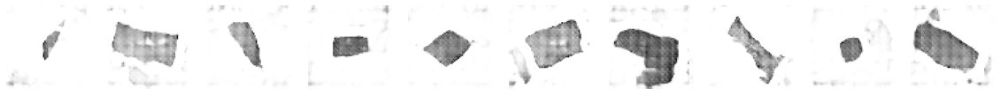

313/313 [==============================] - 655s 2s/step - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 174/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_173.png


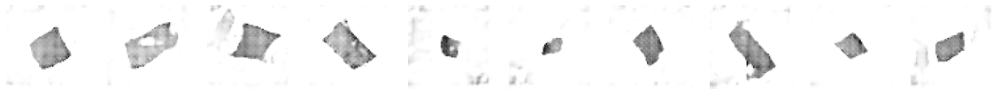

313/313 [==============================] - 654s 2s/step - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 175/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_174.png


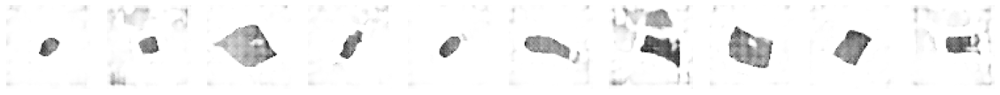

313/313 [==============================] - 655s 2s/step - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 176/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7102 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_175.png


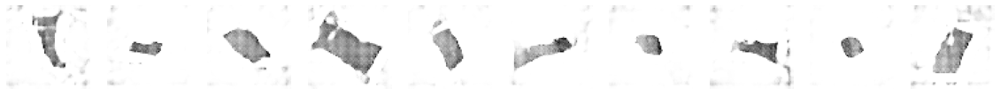

313/313 [==============================] - 656s 2s/step - d_loss: 7.7102 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 177/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7126 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_176.png


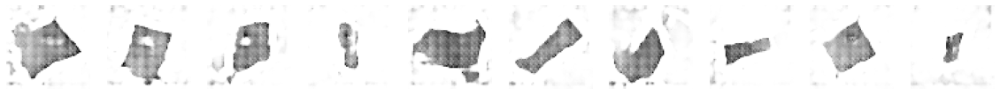

313/313 [==============================] - 662s 2s/step - d_loss: 7.7126 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 178/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7100 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_177.png


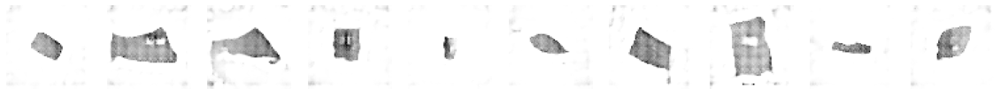

313/313 [==============================] - 655s 2s/step - d_loss: 7.7100 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 179/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7094 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_178.png


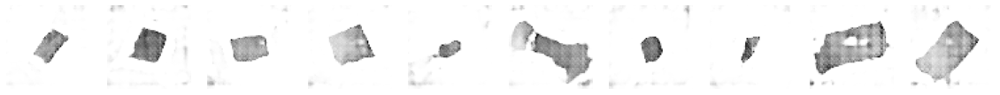

313/313 [==============================] - 653s 2s/step - d_loss: 7.7094 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 180/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_179.png


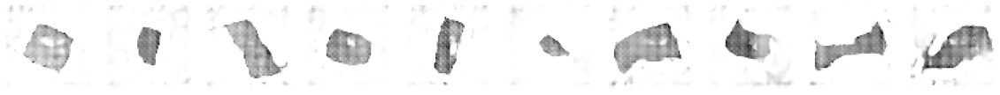

313/313 [==============================] - 654s 2s/step - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 181/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7112 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_180.png


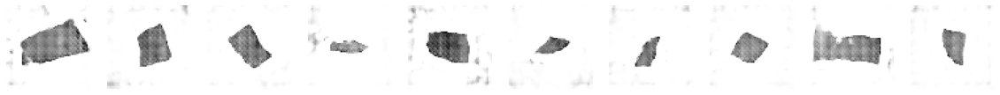

313/313 [==============================] - 653s 2s/step - d_loss: 7.7112 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 182/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_181.png


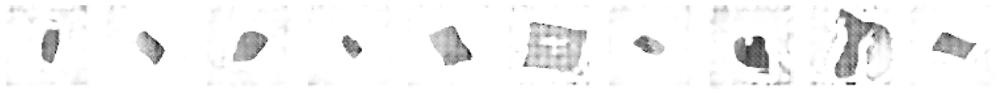

313/313 [==============================] - 655s 2s/step - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 183/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7092 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_182.png


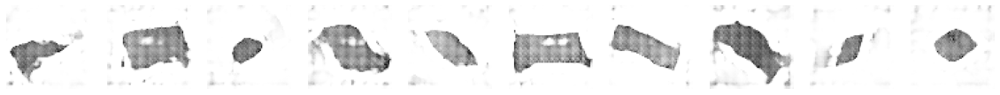

313/313 [==============================] - 666s 2s/step - d_loss: 7.7092 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 184/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_183.png


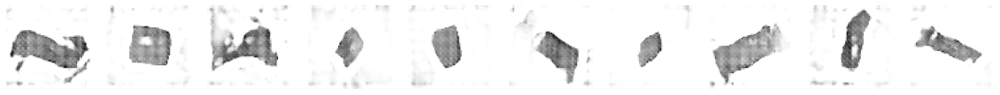

313/313 [==============================] - 658s 2s/step - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 185/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_184.png


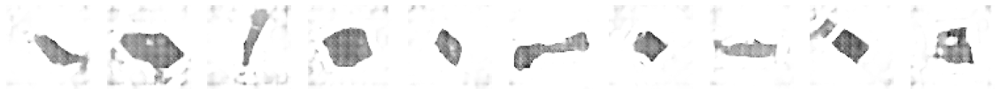

313/313 [==============================] - 690s 2s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 186/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7106 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_185.png


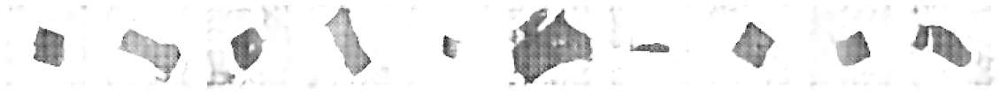

313/313 [==============================] - 652s 2s/step - d_loss: 7.7106 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 187/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_186.png


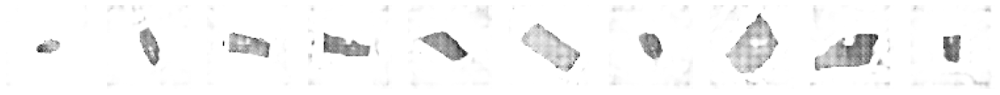

313/313 [==============================] - 652s 2s/step - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 188/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7098 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_187.png


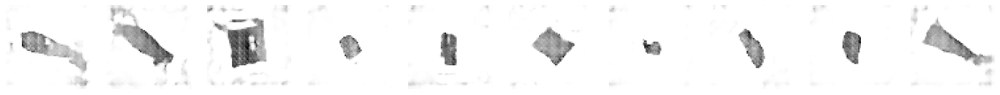

313/313 [==============================] - 653s 2s/step - d_loss: 7.7098 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 189/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_188.png


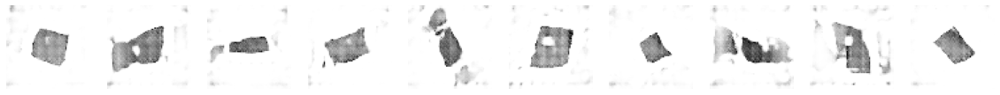

313/313 [==============================] - 655s 2s/step - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 190/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7110 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_189.png


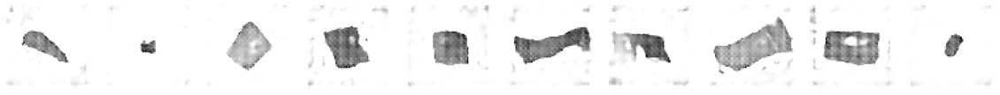

313/313 [==============================] - 653s 2s/step - d_loss: 7.7110 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 191/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_190.png


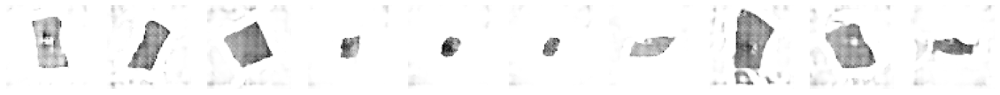

313/313 [==============================] - 653s 2s/step - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 192/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_191.png


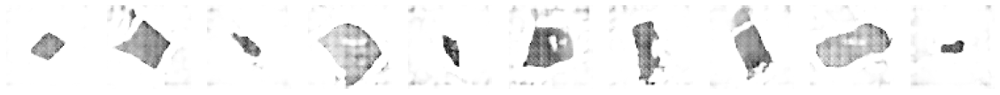

313/313 [==============================] - 653s 2s/step - d_loss: 7.7115 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 193/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_192.png


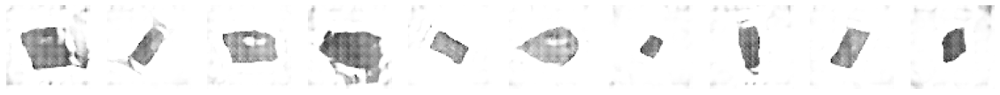

313/313 [==============================] - 653s 2s/step - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 194/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_193.png


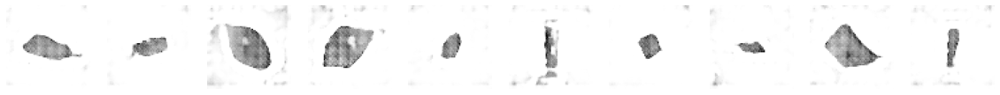

313/313 [==============================] - 654s 2s/step - d_loss: 7.7120 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 195/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_194.png


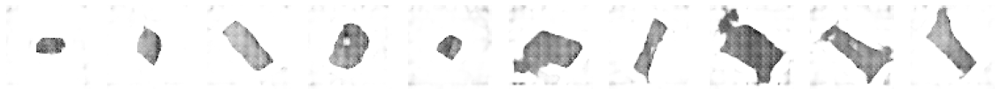

313/313 [==============================] - 653s 2s/step - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 196/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_195.png


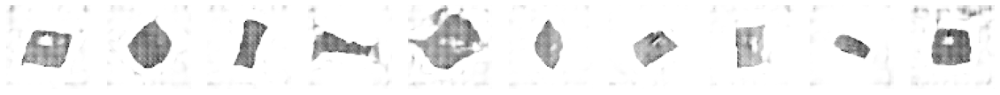

313/313 [==============================] - 655s 2s/step - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 197/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7105 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_196.png


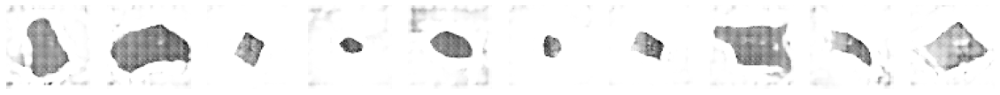

313/313 [==============================] - 652s 2s/step - d_loss: 7.7105 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 198/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7114 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_197.png


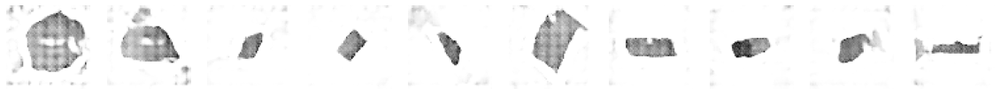

313/313 [==============================] - 654s 2s/step - d_loss: 7.7114 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 199/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_198.png


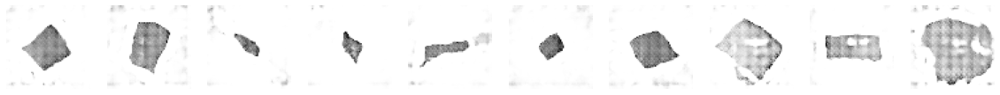

313/313 [==============================] - 654s 2s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 200/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_199.png


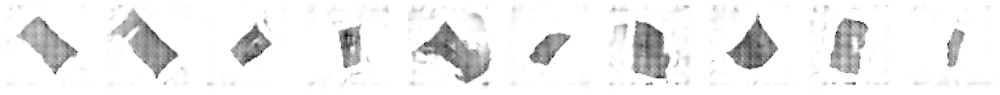

313/313 [==============================] - 664s 2s/step - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 201/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_200.png


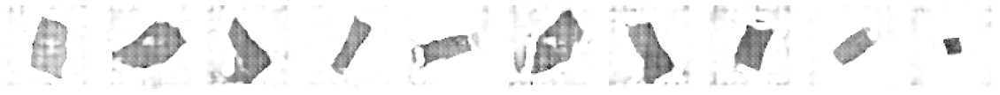

313/313 [==============================] - 654s 2s/step - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 202/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7152 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_201.png


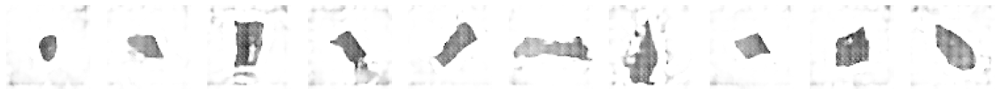

313/313 [==============================] - 652s 2s/step - d_loss: 7.7152 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 203/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_202.png


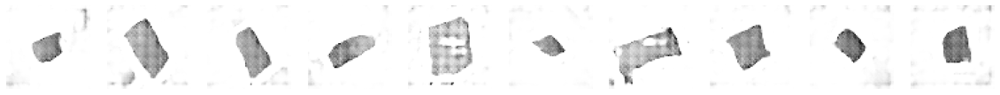

313/313 [==============================] - 657s 2s/step - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 204/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_203.png


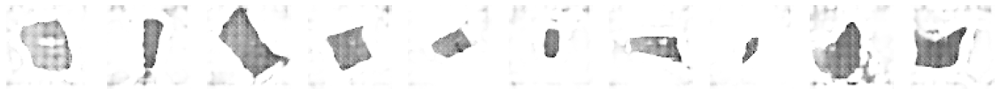

313/313 [==============================] - 658s 2s/step - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 205/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7132 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_204.png


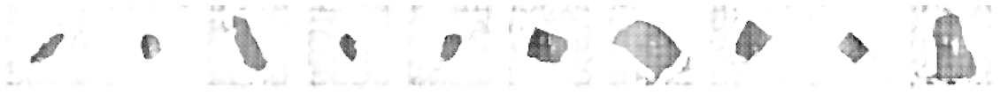

313/313 [==============================] - 654s 2s/step - d_loss: 7.7132 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 206/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_205.png


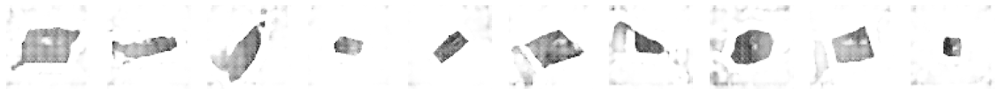

313/313 [==============================] - 653s 2s/step - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 207/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_206.png


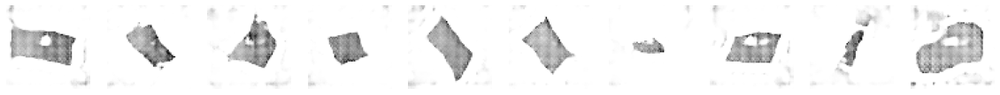

313/313 [==============================] - 653s 2s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 208/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_207.png


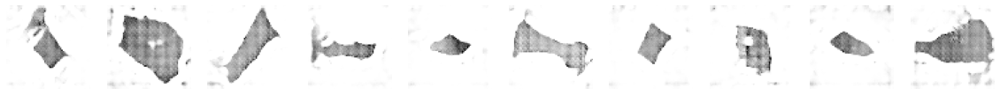

313/313 [==============================] - 652s 2s/step - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 209/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7156 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_208.png


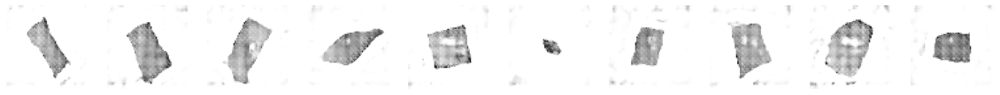

313/313 [==============================] - 687s 2s/step - d_loss: 7.7156 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 210/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_209.png


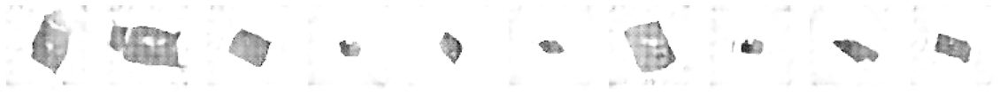

313/313 [==============================] - 656s 2s/step - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 211/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_210.png


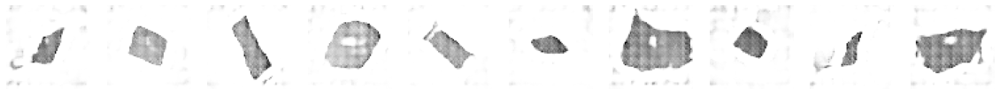

313/313 [==============================] - 659s 2s/step - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 212/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7147 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_211.png


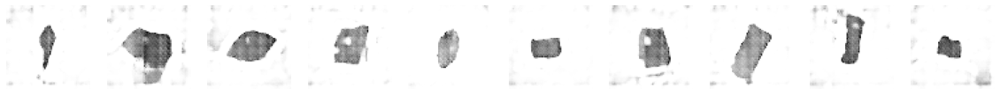

313/313 [==============================] - 656s 2s/step - d_loss: 7.7147 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 213/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_212.png


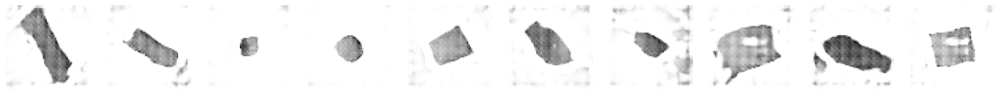

313/313 [==============================] - 655s 2s/step - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 214/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7119 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_213.png


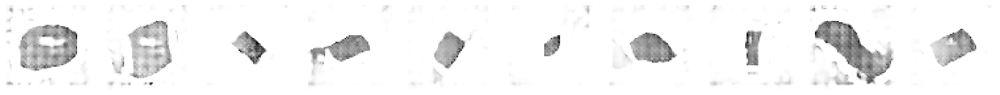

313/313 [==============================] - 658s 2s/step - d_loss: 7.7119 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 215/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_214.png


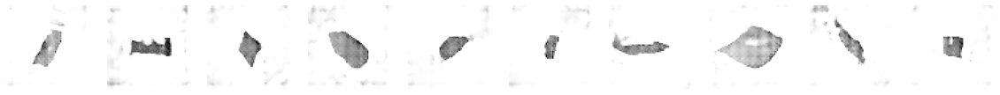

313/313 [==============================] - 656s 2s/step - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 216/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_215.png


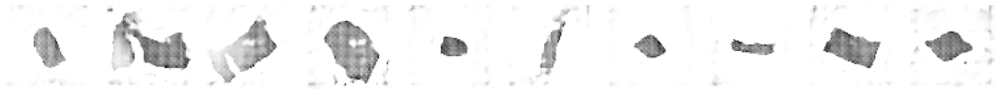

313/313 [==============================] - 664s 2s/step - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 217/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_216.png


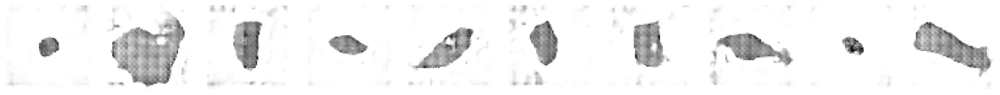

313/313 [==============================] - 659s 2s/step - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 218/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7087 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_217.png


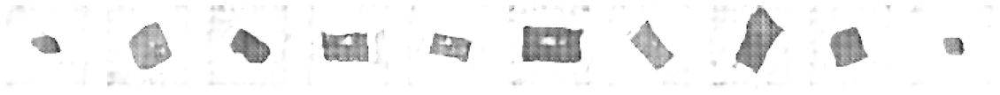

313/313 [==============================] - 654s 2s/step - d_loss: 7.7087 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 219/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7106 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_218.png


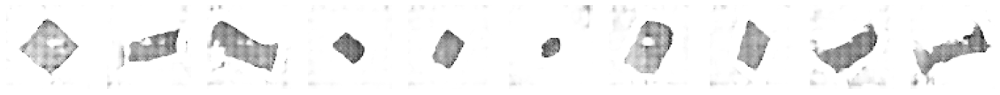

313/313 [==============================] - 656s 2s/step - d_loss: 7.7106 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 220/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_219.png


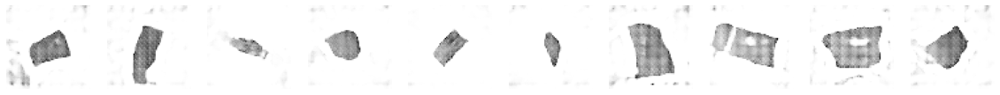

313/313 [==============================] - 656s 2s/step - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 221/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7119 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_220.png


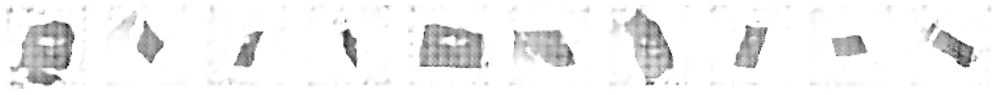

313/313 [==============================] - 1086s 3s/step - d_loss: 7.7119 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 222/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_221.png


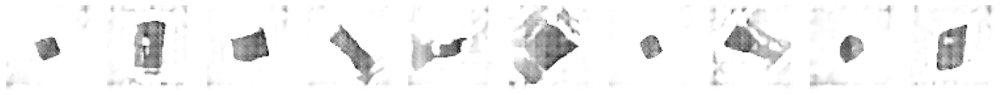

313/313 [==============================] - 656s 2s/step - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 223/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_222.png


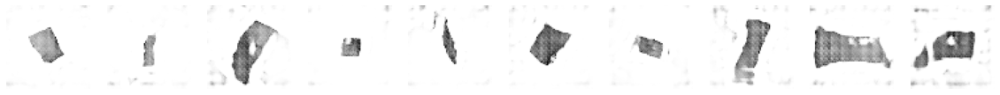

313/313 [==============================] - 656s 2s/step - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 224/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_223.png


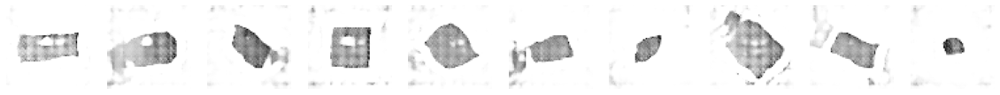

313/313 [==============================] - 654s 2s/step - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 225/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_224.png


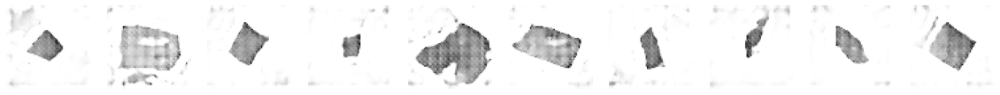

313/313 [==============================] - 654s 2s/step - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 226/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7121 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_225.png


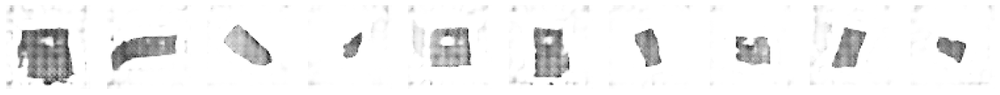

313/313 [==============================] - 655s 2s/step - d_loss: 7.7121 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 227/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_226.png


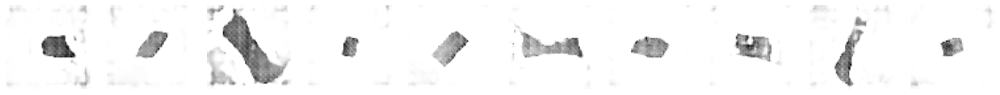

313/313 [==============================] - 656s 2s/step - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 228/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_227.png


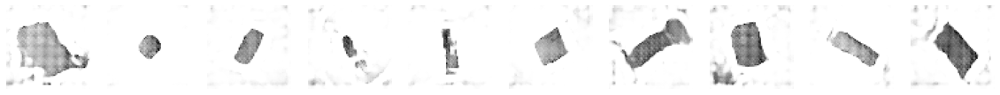

313/313 [==============================] - 657s 2s/step - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 229/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_228.png


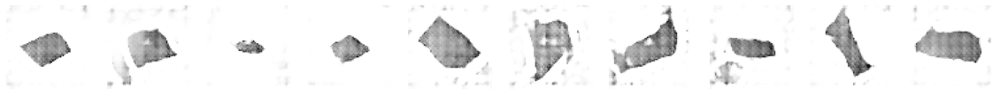

313/313 [==============================] - 655s 2s/step - d_loss: 7.7108 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 230/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_229.png


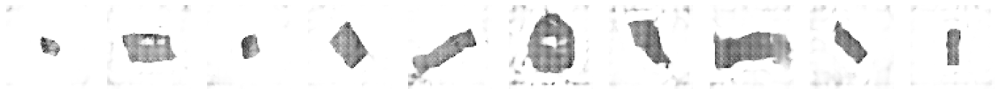

313/313 [==============================] - 654s 2s/step - d_loss: 7.7125 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 231/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7095 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_230.png


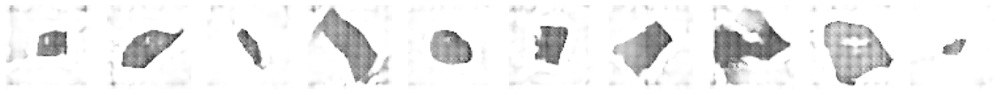

313/313 [==============================] - 655s 2s/step - d_loss: 7.7095 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 232/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7156 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_231.png


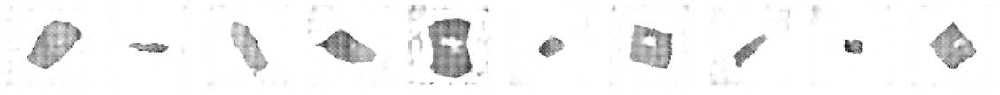

313/313 [==============================] - 1193s 4s/step - d_loss: 7.7156 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 233/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_232.png


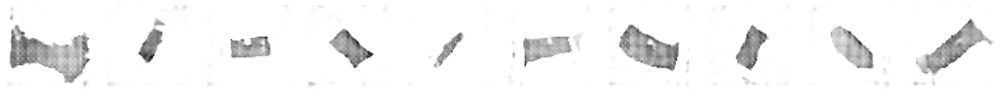

313/313 [==============================] - 656s 2s/step - d_loss: 7.7134 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 234/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_233.png


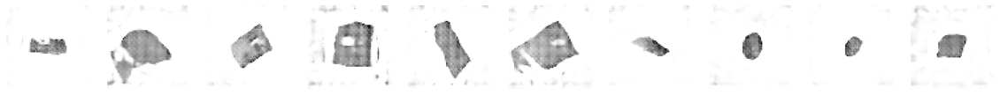

313/313 [==============================] - 655s 2s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 235/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7148 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_234.png


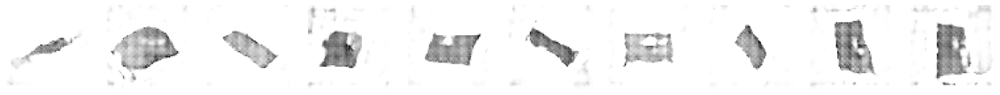

313/313 [==============================] - 655s 2s/step - d_loss: 7.7148 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 236/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_235.png


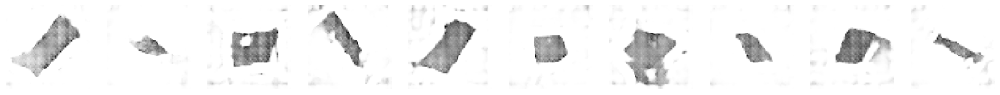

313/313 [==============================] - 654s 2s/step - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 237/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7143 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_236.png


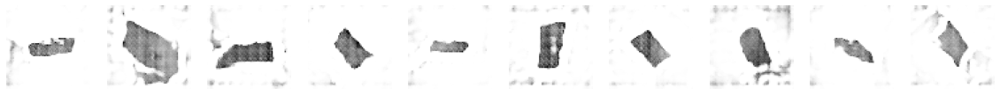

313/313 [==============================] - 654s 2s/step - d_loss: 7.7143 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 238/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_237.png


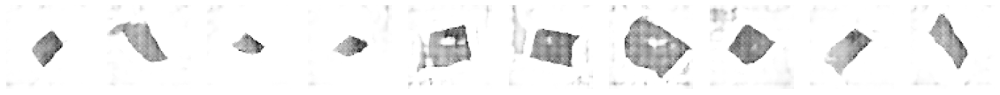

313/313 [==============================] - 658s 2s/step - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 239/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7148 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_238.png


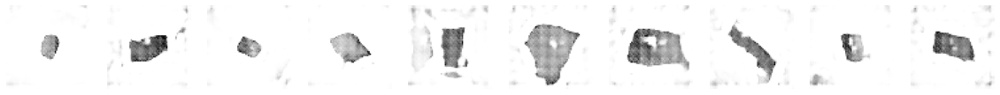

313/313 [==============================] - 654s 2s/step - d_loss: 7.7148 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 240/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_239.png


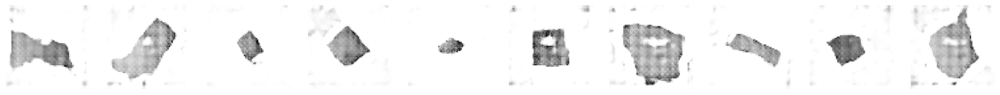

313/313 [==============================] - 654s 2s/step - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 241/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7097 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_240.png


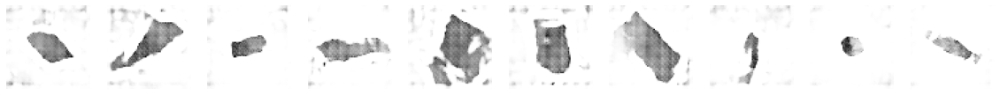

313/313 [==============================] - 653s 2s/step - d_loss: 7.7097 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 242/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_241.png


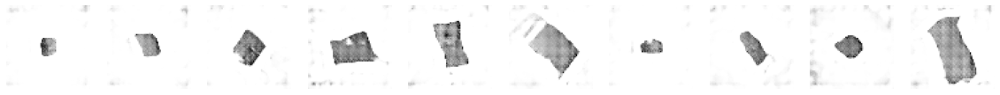

313/313 [==============================] - 655s 2s/step - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 243/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_242.png


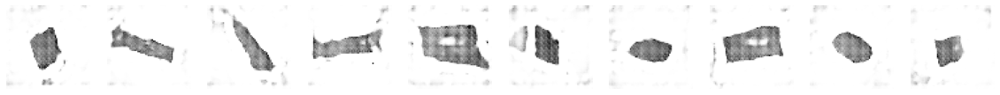

313/313 [==============================] - 657s 2s/step - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 244/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_243.png


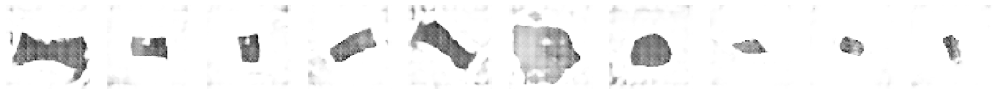

313/313 [==============================] - 1241s 4s/step - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 245/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_244.png


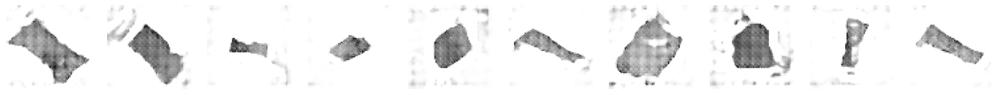

313/313 [==============================] - 655s 2s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 246/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7105 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_245.png


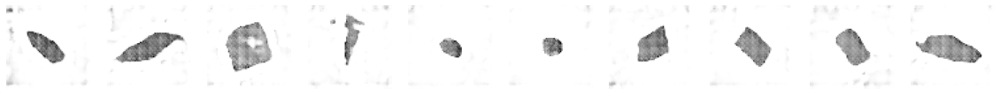

313/313 [==============================] - 655s 2s/step - d_loss: 7.7105 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 247/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_246.png


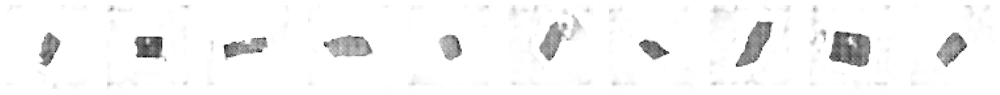

313/313 [==============================] - 663s 2s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 248/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_247.png


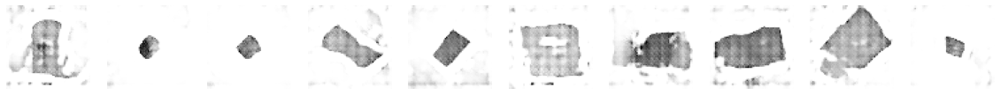

313/313 [==============================] - 658s 2s/step - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 249/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_248.png


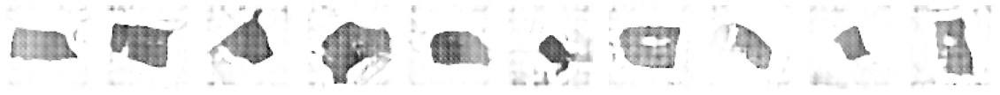

313/313 [==============================] - 657s 2s/step - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 250/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7101 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_249.png


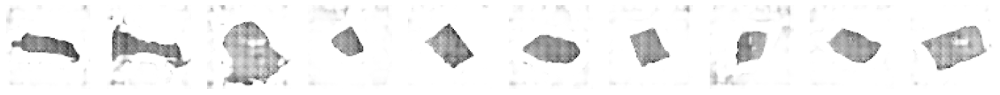

313/313 [==============================] - 655s 2s/step - d_loss: 7.7101 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 251/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_250.png


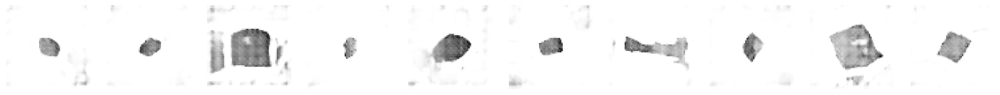

313/313 [==============================] - 654s 2s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 252/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_251.png


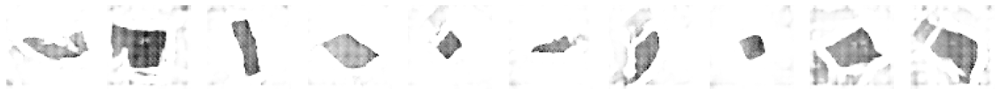

313/313 [==============================] - 656s 2s/step - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 253/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7105 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_252.png


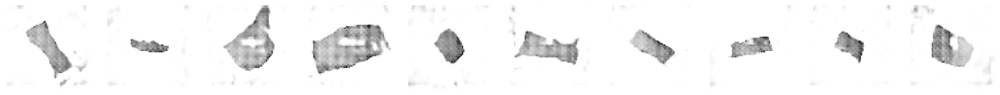

313/313 [==============================] - 655s 2s/step - d_loss: 7.7105 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 254/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7100 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_253.png


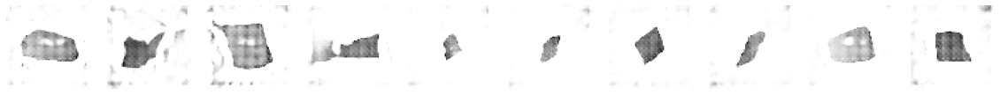

313/313 [==============================] - 654s 2s/step - d_loss: 7.7100 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 255/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_254.png


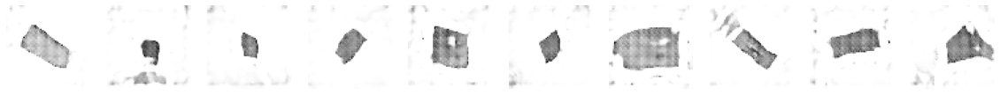

313/313 [==============================] - 960s 3s/step - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 256/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7109 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_255.png


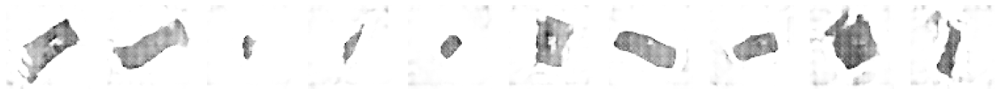

313/313 [==============================] - 655s 2s/step - d_loss: 7.7109 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 257/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7111 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_256.png


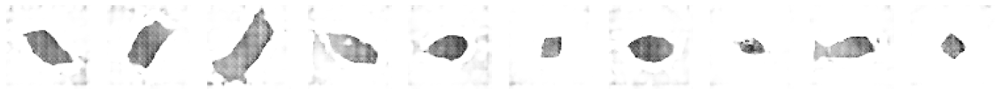

313/313 [==============================] - 654s 2s/step - d_loss: 7.7111 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 258/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_257.png


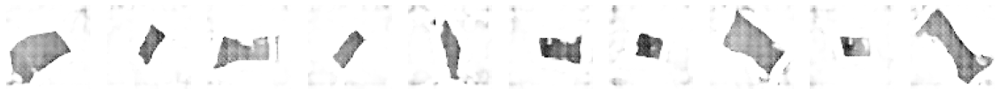

313/313 [==============================] - 655s 2s/step - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 259/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7126 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_258.png


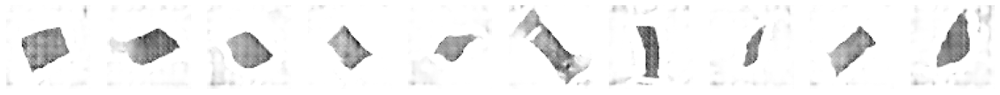

313/313 [==============================] - 655s 2s/step - d_loss: 7.7126 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 260/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7102 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_259.png


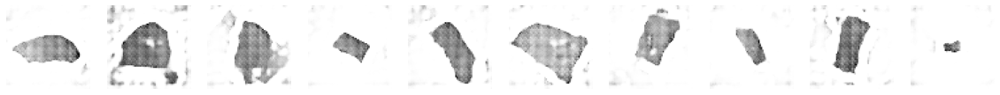

313/313 [==============================] - 656s 2s/step - d_loss: 7.7102 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 261/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_260.png


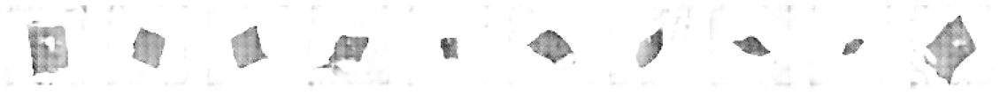

313/313 [==============================] - 655s 2s/step - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 262/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7164 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_261.png


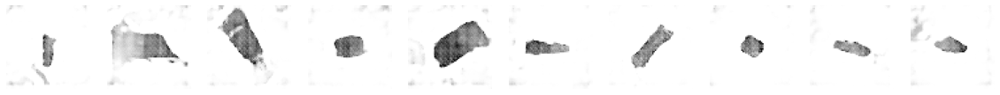

313/313 [==============================] - 655s 2s/step - d_loss: 7.7164 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 263/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7101 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_262.png


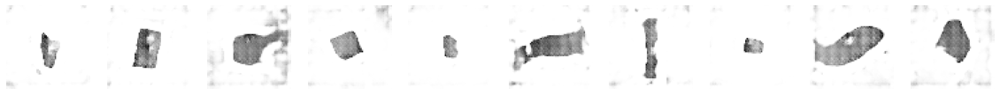

313/313 [==============================] - 657s 2s/step - d_loss: 7.7101 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 264/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_263.png


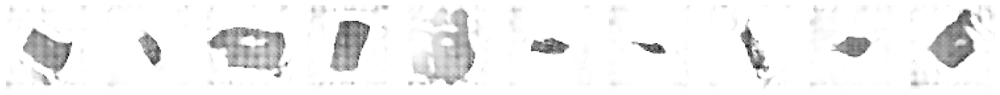

313/313 [==============================] - 655s 2s/step - d_loss: 7.7136 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 265/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_264.png


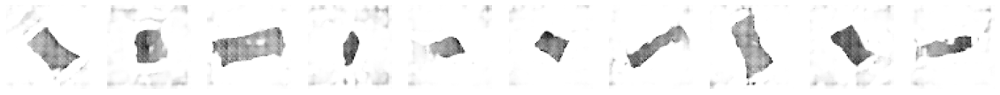

313/313 [==============================] - 656s 2s/step - d_loss: 7.7145 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 266/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_265.png


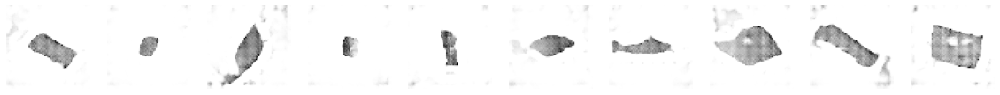

313/313 [==============================] - 655s 2s/step - d_loss: 7.7116 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 267/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7098 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_266.png


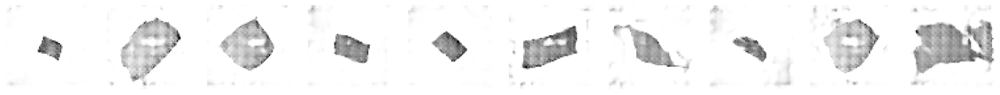

313/313 [==============================] - 862s 3s/step - d_loss: 7.7098 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 268/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7114 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_267.png


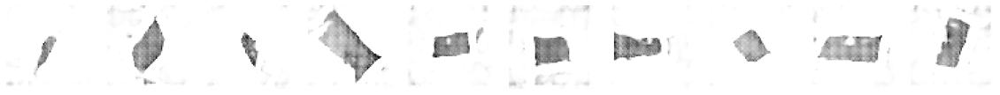

313/313 [==============================] - 655s 2s/step - d_loss: 7.7114 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 269/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_268.png


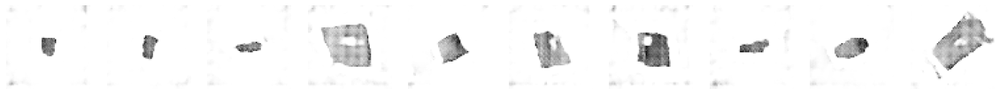

313/313 [==============================] - 656s 2s/step - d_loss: 7.7117 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 270/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_269.png


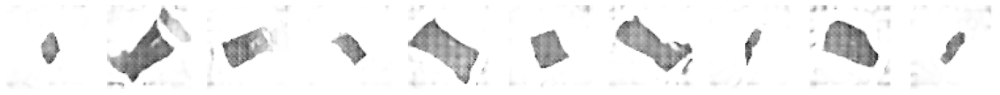

313/313 [==============================] - 655s 2s/step - d_loss: 7.7122 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 271/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7101 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_270.png


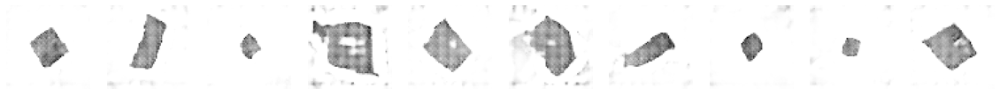

313/313 [==============================] - 655s 2s/step - d_loss: 7.7101 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 272/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_271.png


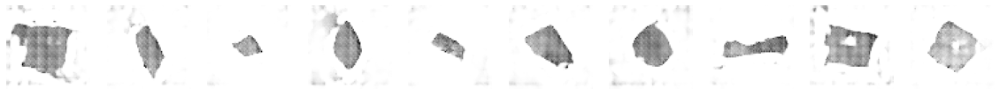

313/313 [==============================] - 654s 2s/step - d_loss: 7.7131 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 273/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_272.png


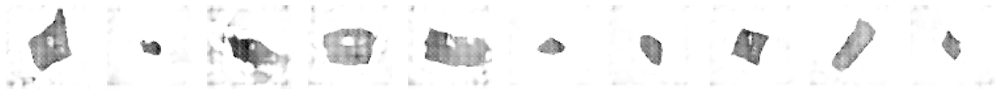

313/313 [==============================] - 657s 2s/step - d_loss: 7.7127 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 274/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_273.png


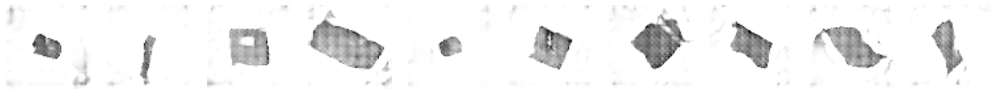

313/313 [==============================] - 656s 2s/step - d_loss: 7.7139 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 275/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_274.png


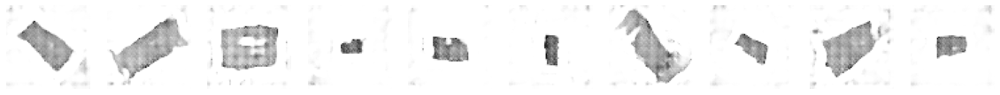

313/313 [==============================] - 653s 2s/step - d_loss: 7.7128 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 276/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7156 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_275.png


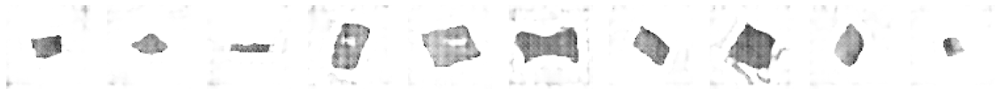

313/313 [==============================] - 654s 2s/step - d_loss: 7.7156 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 277/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_276.png


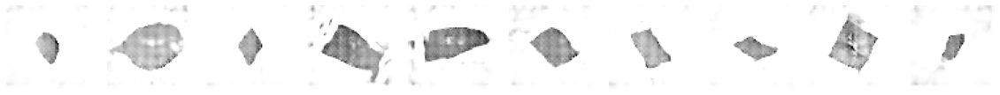

313/313 [==============================] - 655s 2s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 278/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_277.png


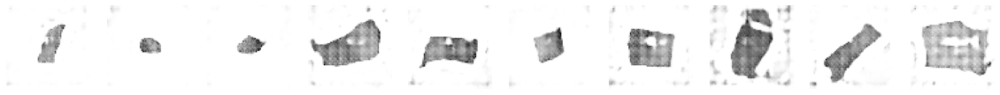

313/313 [==============================] - 921s 3s/step - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 279/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_278.png


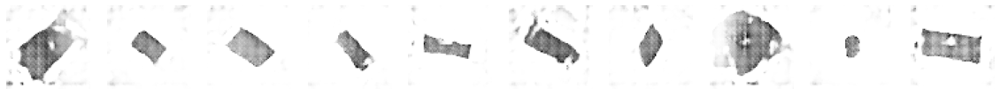

313/313 [==============================] - 654s 2s/step - d_loss: 7.7123 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 280/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_279.png


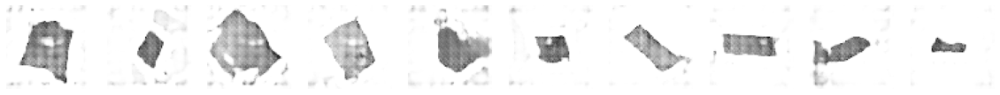

313/313 [==============================] - 655s 2s/step - d_loss: 7.7137 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 281/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_280.png


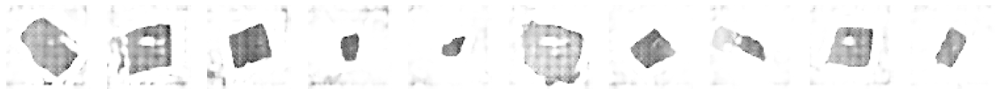

313/313 [==============================] - 658s 2s/step - d_loss: 7.7133 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 282/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_281.png


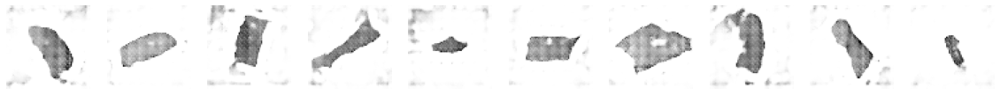

313/313 [==============================] - 656s 2s/step - d_loss: 7.7130 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 283/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7112 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_282.png


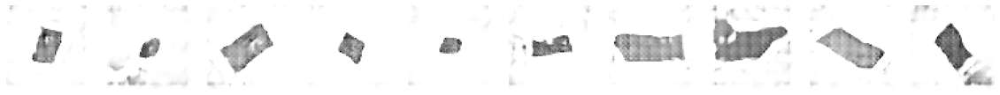

313/313 [==============================] - 654s 2s/step - d_loss: 7.7112 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 284/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_283.png


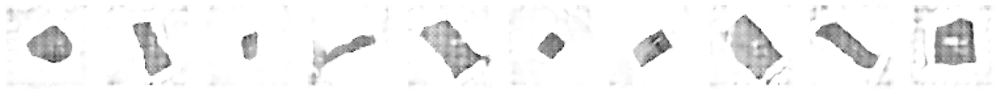

313/313 [==============================] - 655s 2s/step - d_loss: 7.7129 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 285/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_284.png


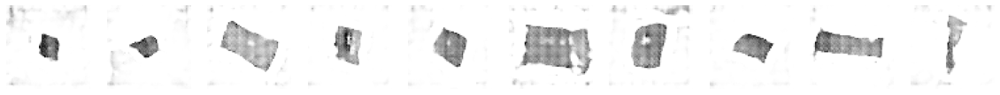

313/313 [==============================] - 655s 2s/step - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 286/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_285.png


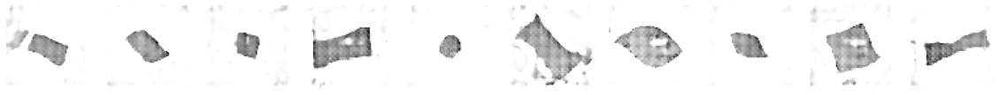

313/313 [==============================] - 656s 2s/step - d_loss: 7.7142 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 287/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_286.png


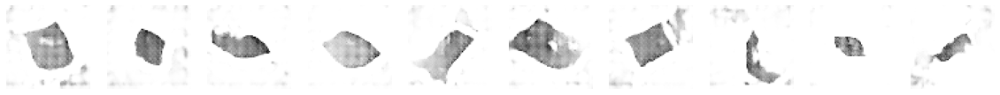

313/313 [==============================] - 655s 2s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 288/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_287.png


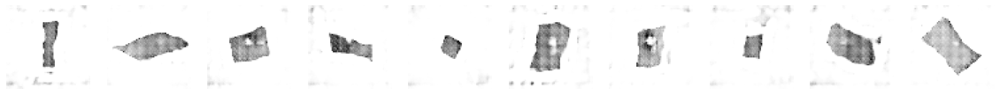

313/313 [==============================] - 656s 2s/step - d_loss: 7.7124 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 289/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_288.png


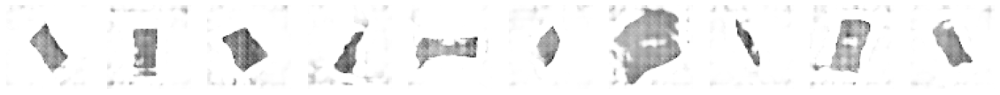

313/313 [==============================] - 655s 2s/step - d_loss: 7.7146 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 290/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7102 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_289.png


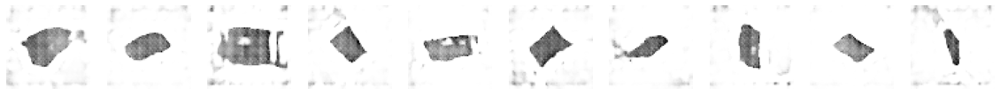

313/313 [==============================] - 876s 3s/step - d_loss: 7.7102 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 291/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7098 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_290.png


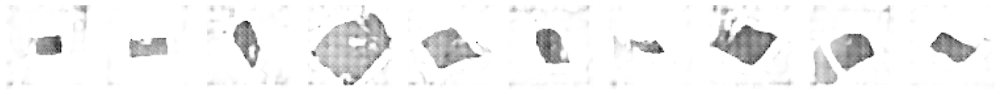

313/313 [==============================] - 654s 2s/step - d_loss: 7.7098 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 292/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_291.png


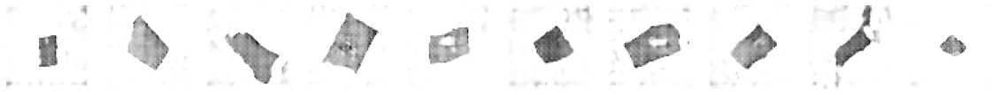

313/313 [==============================] - 654s 2s/step - d_loss: 7.7138 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 293/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7097 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_292.png


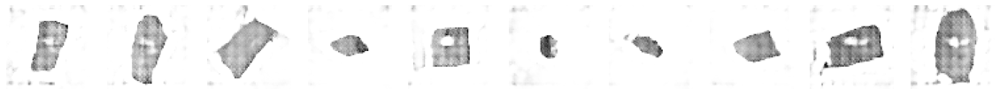

313/313 [==============================] - 657s 2s/step - d_loss: 7.7097 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 294/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_293.png


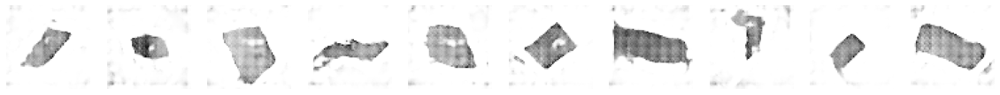

313/313 [==============================] - 655s 2s/step - d_loss: 7.7144 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 295/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_294.png


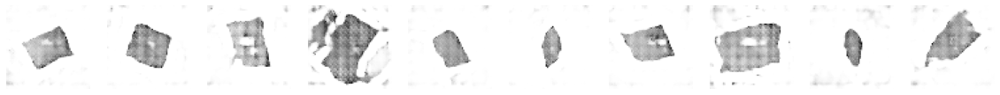

313/313 [==============================] - 657s 2s/step - d_loss: 7.7107 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 296/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7143 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_295.png


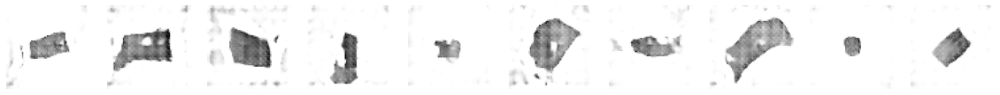

313/313 [==============================] - 655s 2s/step - d_loss: 7.7143 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 297/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7152 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_296.png


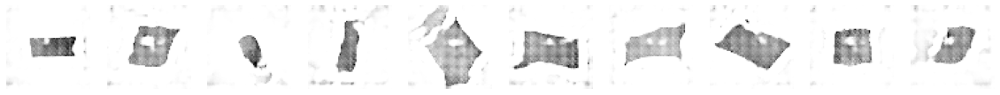

313/313 [==============================] - 654s 2s/step - d_loss: 7.7152 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 298/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7109 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_297.png


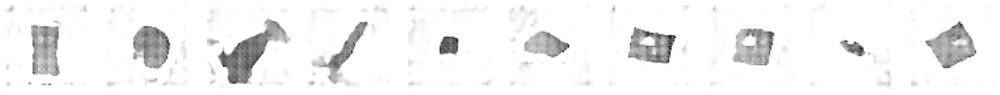

313/313 [==============================] - 655s 2s/step - d_loss: 7.7109 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 299/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_298.png


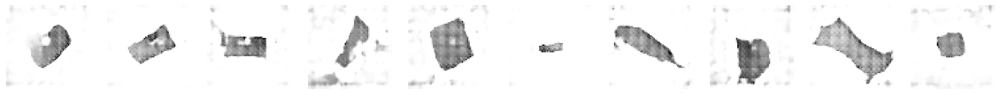

313/313 [==============================] - 659s 2s/step - d_loss: 7.7113 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Epoch 300/300
313/313 [==============================] - ETA: 0s - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00
Saved to ./output/generated_img_299.png


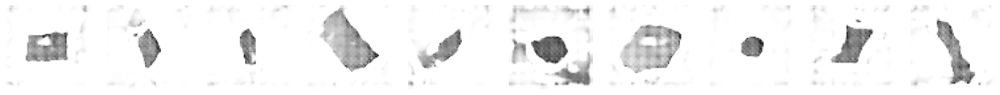

313/313 [==============================] - 654s 2s/step - d_loss: 7.7151 - d_real_acc: 0.0000e+00 - d_fake_acc: 1.0000 - d_acc: 0.5000 - g_loss: 15.4250 - g_acc: 0.0000e+00


In [14]:
dcgan.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
#        model_checkpoint_callback,
#        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [15]:
# Save the final models
generator.save("./models/generator")
discriminator.save("./models/discriminator")

INFO:tensorflow:Assets written to: ./models/generator\assets


INFO:tensorflow:Assets written to: ./models/generator\assets


INFO:tensorflow:Assets written to: ./models/discriminator\assets


INFO:tensorflow:Assets written to: ./models/discriminator\assets


## 3. Generate new images <a name="decode"></a>

In [16]:
# Sample some points in the latent space, from the standard normal distribution
grid_width, grid_height = (10, 3)
z_sample = np.random.normal(size=(grid_width * grid_height, Z_DIM))

In [17]:
# Decode the sampled points
reconstructions = generator.predict(z_sample)

1/1 [==============================] - 0s 232ms/step


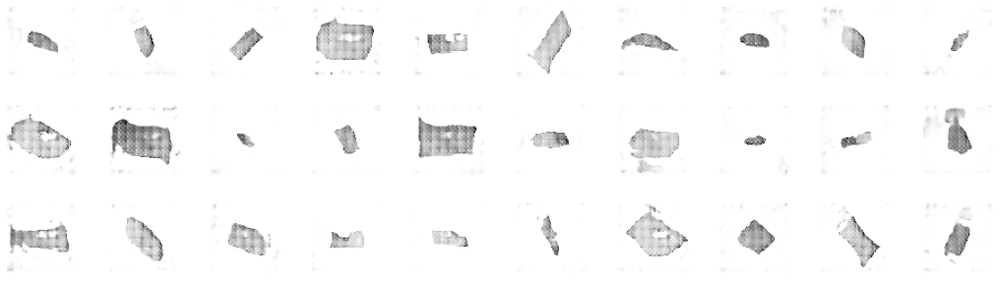

In [18]:
# Draw a plot of decoded images
fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Output the grid of faces
for i in range(grid_width * grid_height):
    ax = fig.add_subplot(grid_height, grid_width, i + 1)
    ax.axis("off")
    ax.imshow(reconstructions[i, :, :], cmap="Greys")

In [19]:
def compare_images(img1, img2):
    return np.mean(np.abs(img1 - img2))

In [20]:
all_data = []
for i in train.as_numpy_iterator():
    all_data.extend(i)
all_data = np.array(all_data)

1/1 [==============================] - 0s 62ms/step


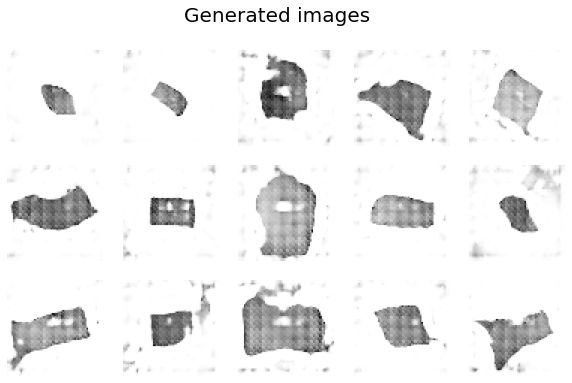

In [21]:
r, c = 3, 5
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Generated images", fontsize=20)

noise = np.random.normal(size=(r * c, Z_DIM))
gen_imgs = generator.predict(noise)

cnt = 0
for i in range(r):
    for j in range(c):
        axs[i, j].imshow(gen_imgs[cnt], cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()

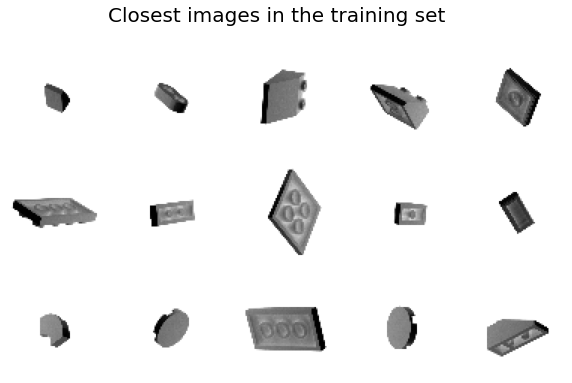

In [22]:
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Closest images in the training set", fontsize=20)

cnt = 0
for i in range(r):
    for j in range(c):
        c_diff = 99999
        c_img = None
        for k_idx, k in enumerate(all_data):
            diff = compare_images(gen_imgs[cnt], k)
            if diff < c_diff:
                c_img = np.copy(k)
                c_diff = diff
        axs[i, j].imshow(c_img, cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()